In [1]:
from datetime import date
from glob import glob
import json
import math
import os
import pickle
import sys
import time

import gspread
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from scipy import integrate, interpolate, stats

In [2]:
sys.path.append(r'C:\Users\lesliec\code')

In [3]:
from tbd_eeg.tbd_eeg.data_analysis.eegutils import EEGexp

In [4]:
%matplotlib notebook

In [5]:
areas_of_interest = {
    'MO': ['MOp1', 'MOp2/3', 'MOp5', 'MOp6a', 'MOp6b', 'MOs1', 'MOs2/3', 'MOs5', 'MOs6a', 'MOs6b'],
    'MO-TH': ['AV', 'CL', 'MD', 'PO', 'PF', 'VAL', 'VPL', 'VPM', 'VM'],
    'RT': ['RT'],
}
areacolors = {'MO': 'blueviolet', 'MO-TH': 'limegreen', 'RT': 'salmon'}

#### Functions

In [6]:
def get_stim_event_inds(stim_table, stim_type, stim_param, sweep, trials='all'):
    if trials == 'resting':
        return stim_table[
            (stim_table['stim_type'] == stim_type) &
            (stim_table['parameter'] == stim_param) &
            (stim_table['sweep'] == sweep) &
            (stim_table['good'] == True) &
            (stim_table['resting_trial'] == True)
        ].index.values
    elif trials == 'running':
        return stim_table[
            (stim_table['stim_type'] == stim_type) &
            (stim_table['parameter'] == stim_param) &
            (stim_table['sweep'] == sweep) &
            (stim_table['good'] == True) &
            (stim_table['resting_trial'] == False)
        ].index.values
    else:
        return stim_table[
            (stim_table['stim_type'] == stim_type) &
            (stim_table['parameter'] == stim_param) &
            (stim_table['sweep'] == sweep) &
            (stim_table['good'] == True)
        ].index.values

In [7]:
def get_zFR(trig_FR, FRtime):
    
    trig_Z = np.zeros_like(trig_FR) * np.nan # try NaNs, it works
    baseline_avg = np.mean(trig_FR[FRtime < 0, :], axis=0)
    baseline_std = np.std(trig_FR[FRtime < 0, :], axis=0)
    nonzero_inds = np.nonzero(baseline_std)[0]
    trig_Z[:, nonzero_inds] = (trig_FR[:, nonzero_inds] - baseline_avg[None, nonzero_inds]) / baseline_std[None, nonzero_inds]
    
    return trig_Z

#### Set plot directory

In [38]:
plotsavedir = r'C:\Users\lesliec\OneDrive - Allen Institute\data\plots\GAT1-KO_analyses'

### Load subjects

In [11]:
multisub_file = r"C:\Users\lesliec\OneDrive - Allen Institute\data\GAT1KO_pilot_subjects.csv"
subject_df = pd.read_csv(multisub_file, converters={'mouse': str})

In [12]:
subject_df.head()

,genotype,mouse,experiment,sweep_states,bad_chs,data_loc,notes
0,GAT1-KO,645606,EEGNPXspont_estim_2022-12-20_12-26-39,awake,none,F:\GAT1_EEG_pilot\mouse645606\EEGNPXspont_esti...,NaN
1,GAT1-KO,644565,EEGNPXspont_estim_2022-12-22_10-36-08,awake,none,F:\GAT1_EEG_pilot\mouse644565\EEGNPXspont_esti...,NaN
2,wildtype,654181,estim_vis_2022-11-22_09-42-58,"awake,isoflurane","7,8,11,13",F:\psi_exp\mouse654181\estim_vis_2022-11-22_09...,NaN
3,wildtype,669118,pilot_aw_2023-03-23_12-14-39,"awake,saline,saline,saline,saline,saline,salin...",none,F:\psi_exp\mouse669118\pilot_aw_2023-03-23_12-...,NaN
4,wildtype,669117,pilot_aw_2023-03-29_11-09-15,"awake,saline,saline,saline,saline,saline,salin...","6,9,13,14",F:\psi_exp\mouse669117\pilot_aw_2023-03-29_11-...,NaN


## Get multi-subject metrics

In [15]:
apply_car = True

In [16]:
all_subjects_data = {}
for indi, subrow in subject_df.iterrows():
    print('{}: {}'.format(subrow.mouse, subrow.experiment))
    all_subjects_data[subrow.mouse] = {}
    
    ## Load EEGexp and stim_log ##
    exp = EEGexp(subrow.data_loc, preprocess=False, make_stim_csv=False)
    stim_log = pd.read_csv(exp.stimulus_log_file).astype({'parameter': str})

    ### Get all states in experiment ###
    all_sweeps = np.unique(stim_log['sweep'].values)
    
    ## Load EEG traces ##
    all_EEG_traces = np.load(os.path.join(exp.data_folder, 'evoked_data', 'event_EEGtraces.npy'))
    EEG_event_timestamps = np.load(os.path.join(exp.data_folder, 'evoked_data', 'event_EEGtraces_times.npy'))
    eeg_chs = np.arange(0, all_EEG_traces.shape[1])
    bad_chs = []
    if subrow.bad_chs != 'none':
        for char in subrow.bad_chs.split(','):
            if char.isdecimal():
                bad_chs.append(int(char))
    GOOD_CHS = np.array([x for x in eeg_chs if x not in bad_chs])
    all_subjects_data[subrow.mouse]['good_chs'] = GOOD_CHS

    ## Get state label for each sweep ##
    sweep_state_list = []
    for char in subrow.sweep_states.split(','):
        sweep_state_list.append(char)
    if len(sweep_state_list) == 1:
        sweep_state_list = sweep_state_list * len(all_sweeps)
    stim_log['state'] = stim_log.apply(lambda x: sweep_state_list[x.sweep], axis=1)
    ## Get list of states and the middle current ##
    currents = np.unique(stim_log[stim_log['stim_type'] == 'biphasic']['parameter'].values).astype(int)
    if len(currents) > 1:
        ch_curr = str(currents[1])
    else:
        ch_curr = str(currents[0])
     
    ## Get event_inds ##
    eventinds = stim_log[
        (stim_log['stim_type'] == 'biphasic') &
        (stim_log['parameter'] == ch_curr) &
        (stim_log['good'] == True) &
        (stim_log['state'] == 'awake')
    ].index.values
    event_traces = all_EEG_traces[:, :, eventinds]
    if apply_car:
        event_traces = event_traces - np.mean(event_traces[:, GOOD_CHS, :], axis=1)[:,None,:]
    all_subjects_data[subrow.mouse]['EEG_traces'] = [EEG_event_timestamps, event_traces]
    print('')

645606: EEGNPXspont_estim_2022-12-20_12-26-39
Experiment type: electrical stimulation

644565: EEGNPXspont_estim_2022-12-22_10-36-08
Experiment type: electrical stimulation

654181: estim_vis_2022-11-22_09-42-58
Experiment type: electrical and sensory stimulation

669118: pilot_aw_2023-03-23_12-14-39
Experiment type: electrical stimulation

669117: pilot_aw_2023-03-29_11-09-15
Experiment type: electrical stimulation



### Plot multisubject

<IPython.core.display.Javascript object>


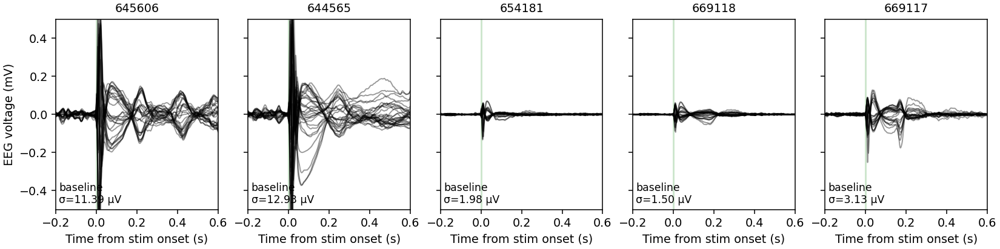

In [39]:
plot_win = [-0.2, 0.6]

fig, axs = plt.subplots(1, len(all_subjects_data), figsize=(12,3), constrained_layout=True, sharex=True, sharey=True)

for ax, (subname, datadict) in zip(axs, all_subjects_data.items()):
    timex = datadict['EEG_traces'][0]
    traces = np.mean(datadict['EEG_traces'][1], axis=2)
    num_trials = datadict['EEG_traces'][1].shape[2]
    BLstd = np.std(traces[:, datadict['good_chs']][timex < 0, :])

    ax.axvline(0, color='g', alpha=0.2)
    ax.plot(timex, traces[:, datadict['good_chs']] * 1E-3, color='k', linewidth=1.0, alpha=0.4)
    ax.annotate(
        'baseline\n\u03c3={:.2f} \u03bcV'.format(BLstd),
        xy=(0.02, 0.02), xycoords='axes fraction', fontsize=9, ha='left', va='bottom'
    )
    ax.set_xlabel('Time from stim onset (s)')
    ax.set_title('{}'.format(subname))
axs[0].set_ylim([-0.5, 0.5])
axs[0].set_xlim(plot_win)
axs[0].set_ylabel('EEG voltage (mV)')

### SAVE ###
fig_name = 'multisub_ERPs_butterfly.png'
# fig.savefig(os.path.join(plotsavedir, fig_name), transparent=False)

In [12]:
skip_states = ['recovery']
psilocybin_window = 90 * 60 # min to include as "psilocybin" -> seconds
substates = {'resting': True, 'running': False}
trial_threshold = 18 # must have more than this number of trials to be included in analysis
trial_max = 125 # limit some states that have many trials
unit_threshold = 5 # must have st least this number of units to be included in analysis
time_bin = 0.0025 # size of time bins (s) for firing rate

sig_test_window = [0.0, 0.3]
sigalpha = 0.05 # significance threshold for unit activation
burst_window = [0.075, 0.3]
early_window = [0.002, 0.025]
late_window = [0.075, 0.3]

### Make single subject example plots

In [15]:
all_states = {
    'awake_resting': 'o', 'awake_running': 'X',
    'psilocybin_resting': 's', 'psilocybin_running': 'P',
    'isoflurane': '^', 'urethane': 'v',
}

<IPython.core.display.Javascript object>


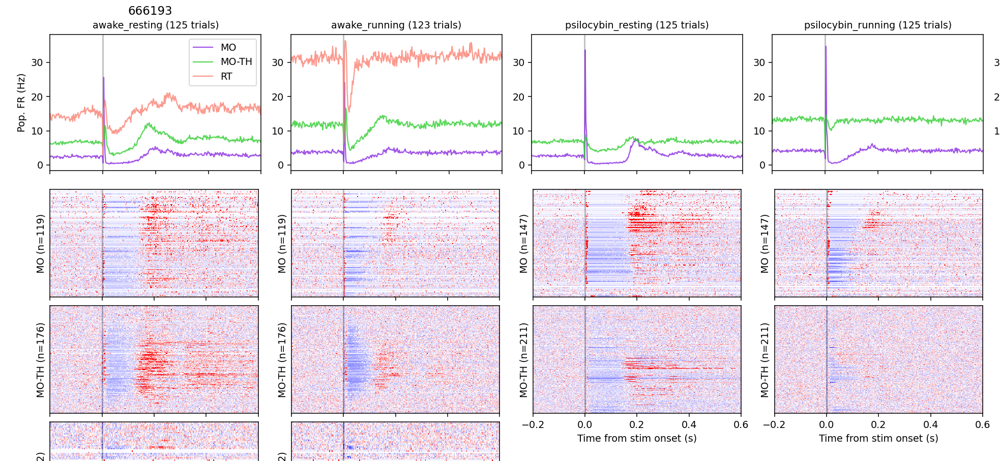

<IPython.core.display.Javascript object>


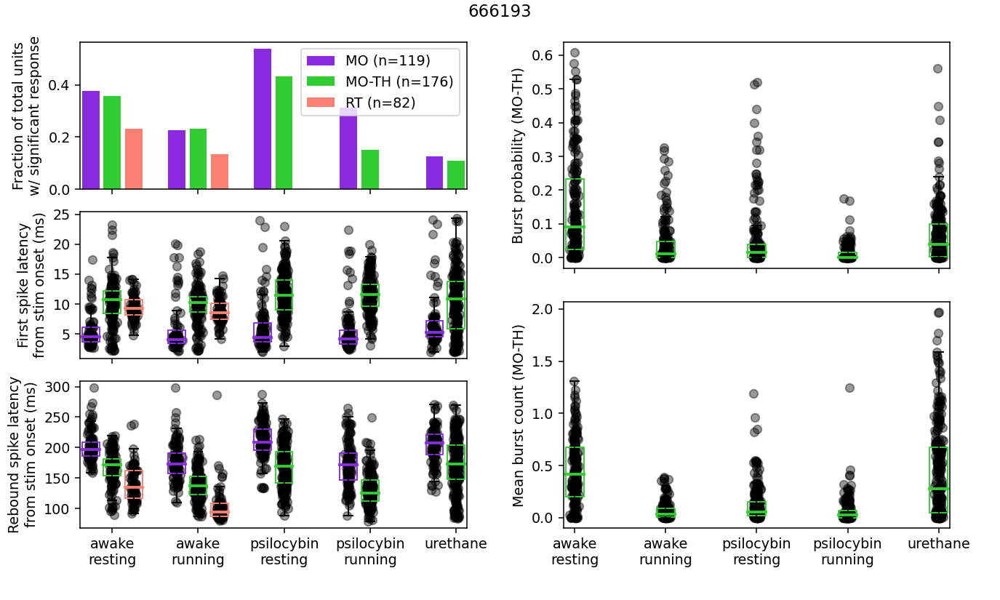

<IPython.core.display.Javascript object>


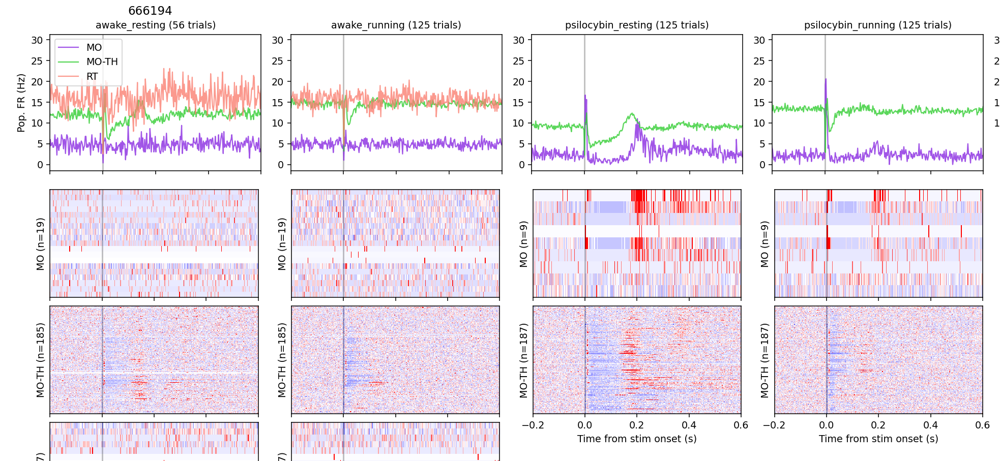

<IPython.core.display.Javascript object>


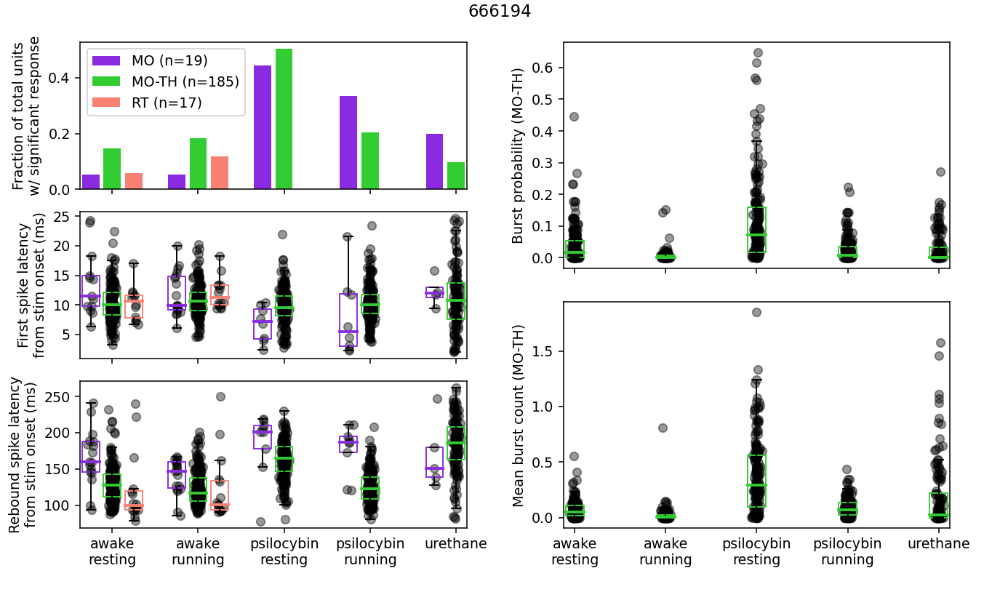

<IPython.core.display.Javascript object>


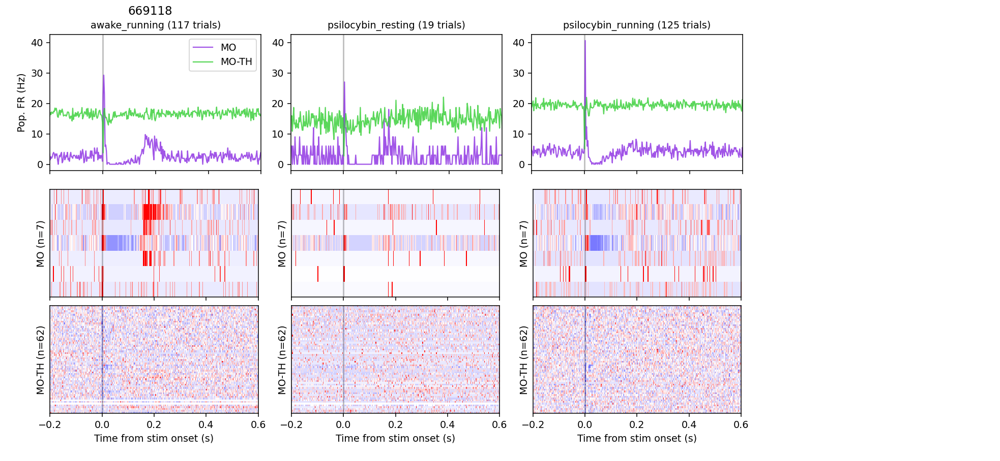

<IPython.core.display.Javascript object>


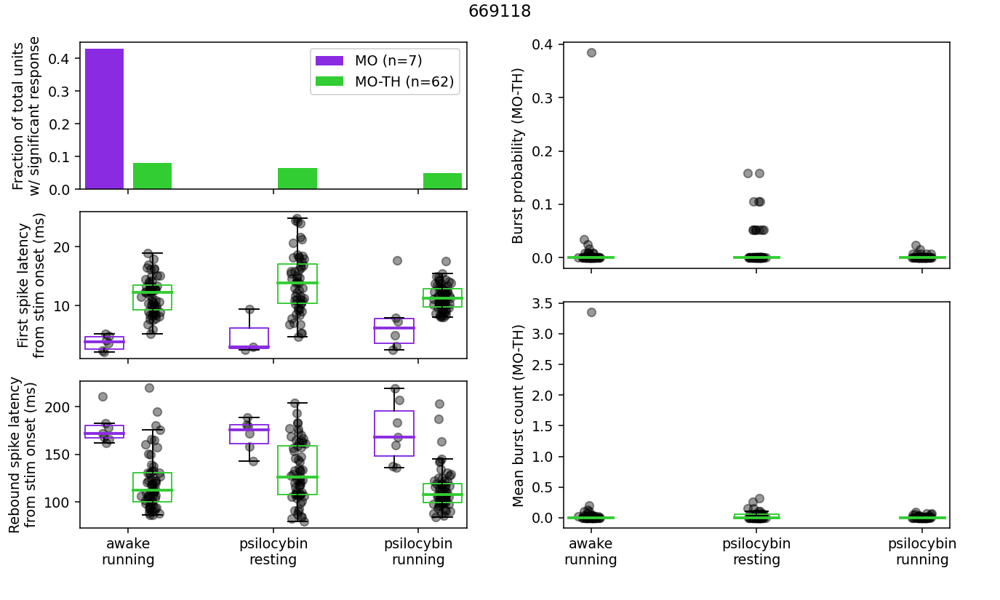

<IPython.core.display.Javascript object>


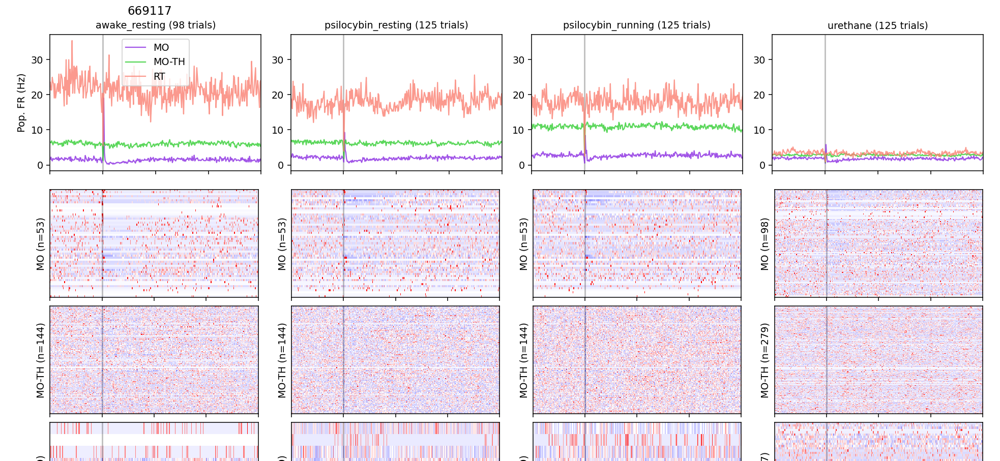

<IPython.core.display.Javascript object>


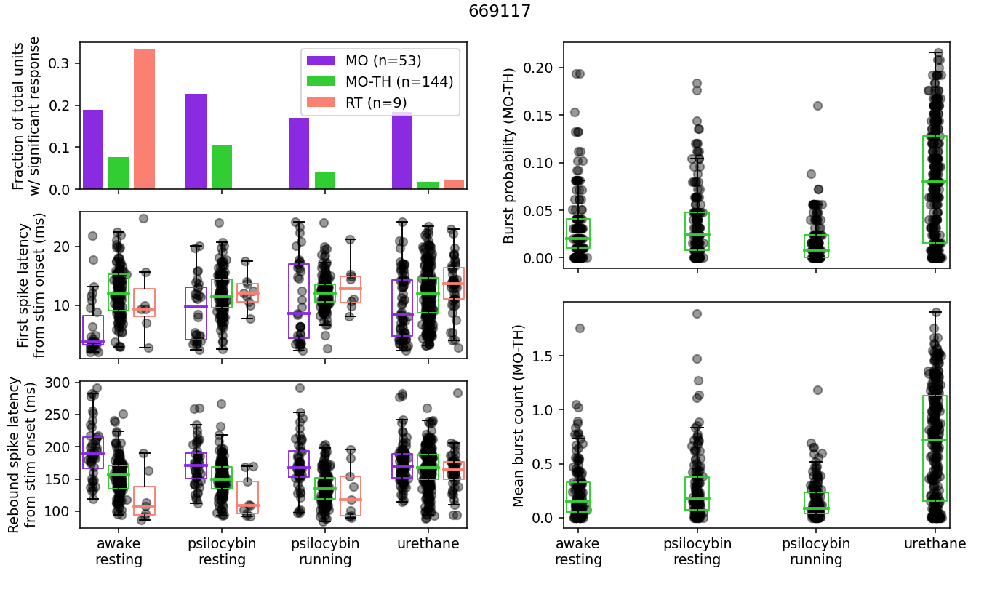

<IPython.core.display.Javascript object>


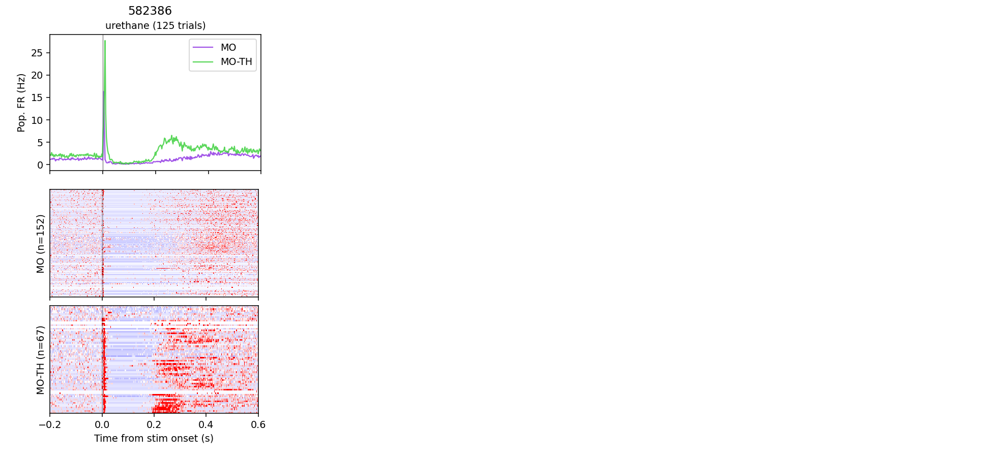

<IPython.core.display.Javascript object>


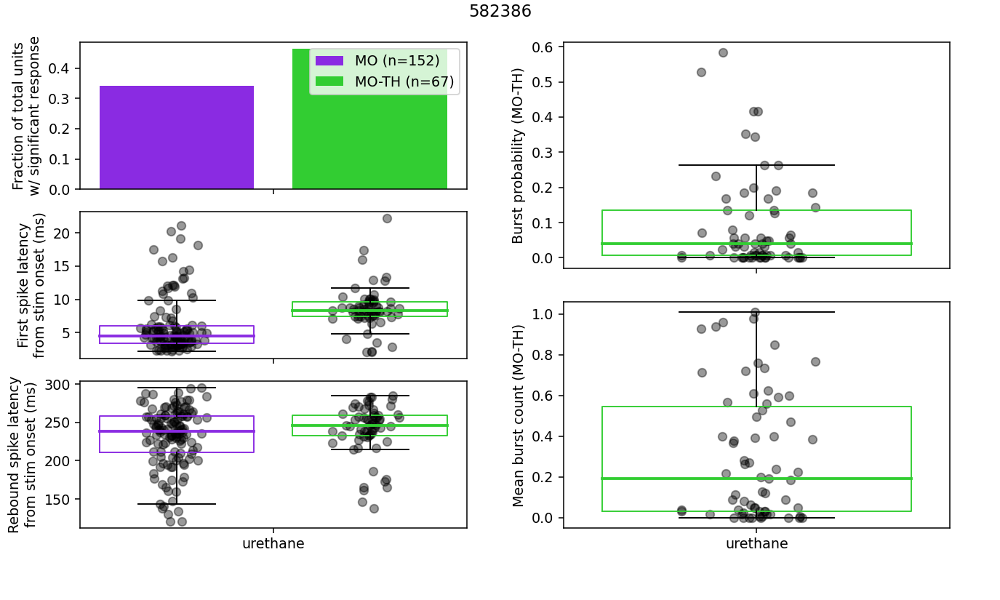

Not making figures for 638703.


<IPython.core.display.Javascript object>


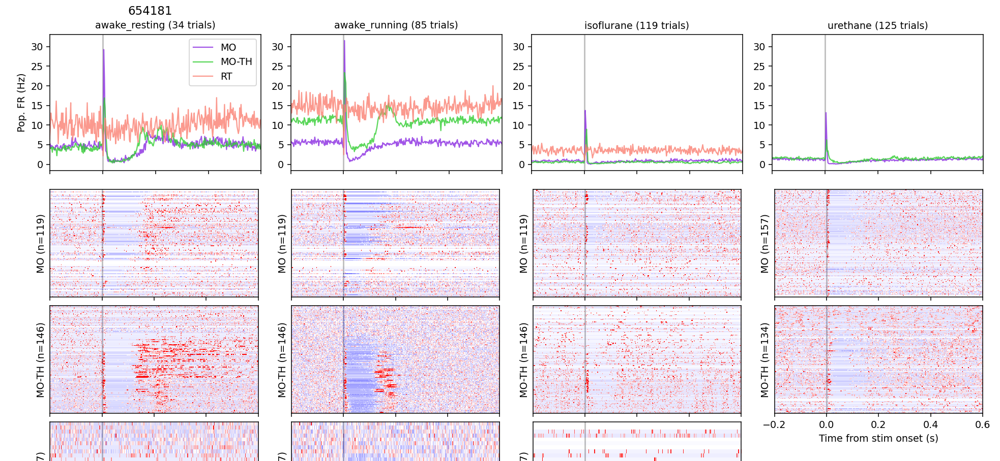

<IPython.core.display.Javascript object>


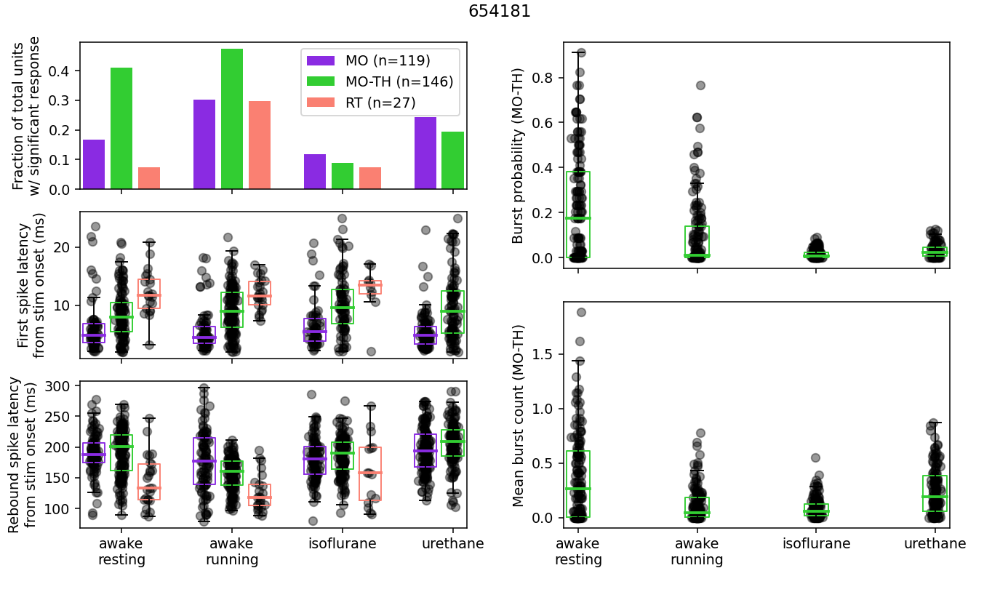

<IPython.core.display.Javascript object>


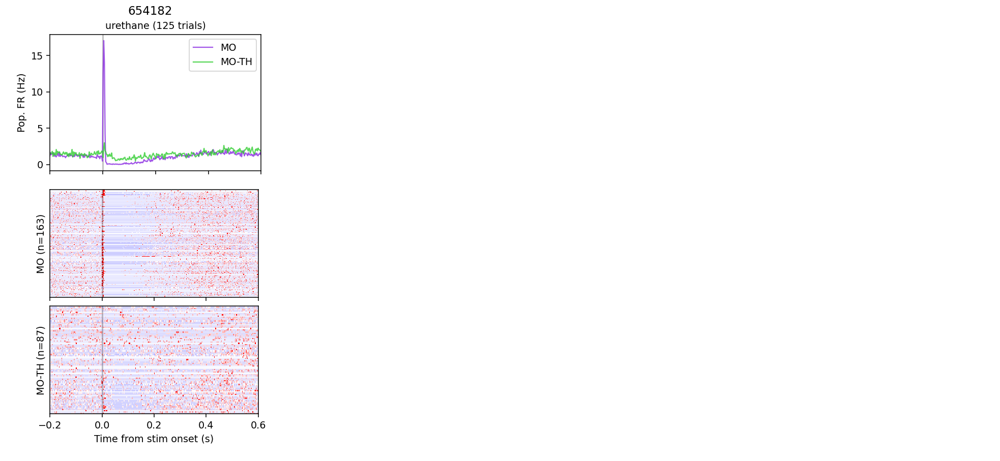

<IPython.core.display.Javascript object>


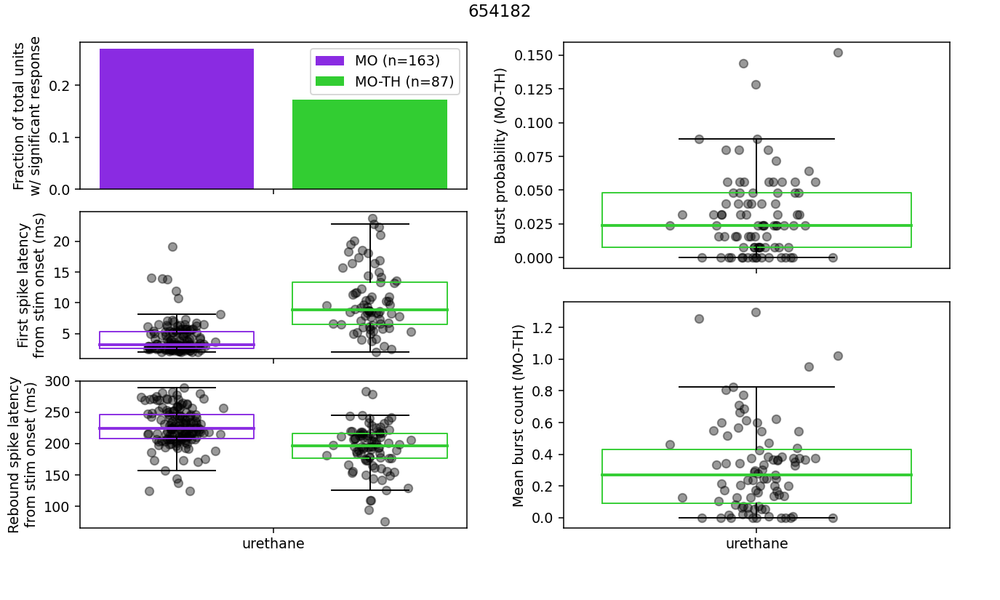

<IPython.core.display.Javascript object>


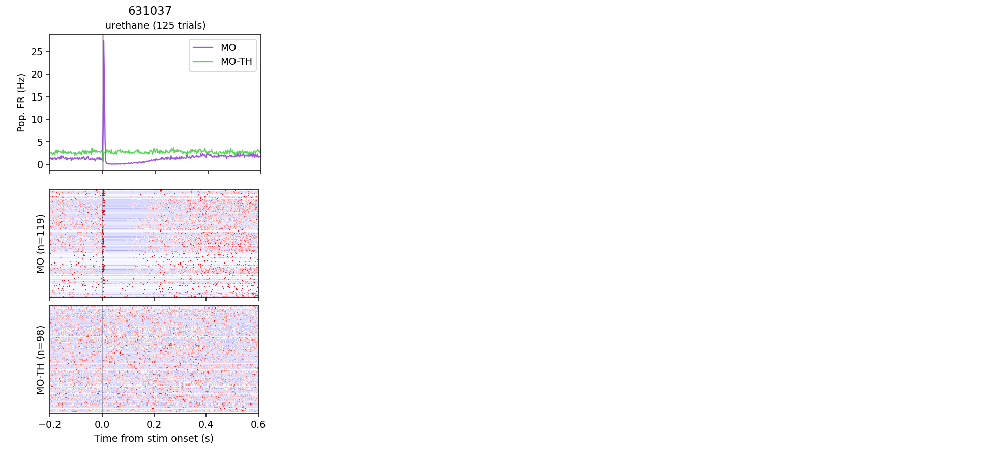

<IPython.core.display.Javascript object>


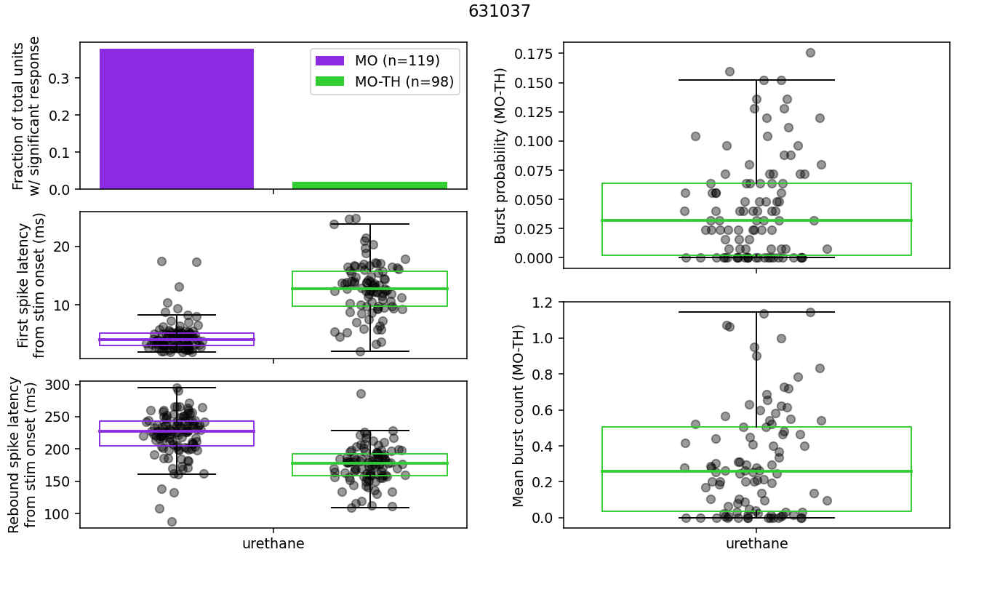

<IPython.core.display.Javascript object>


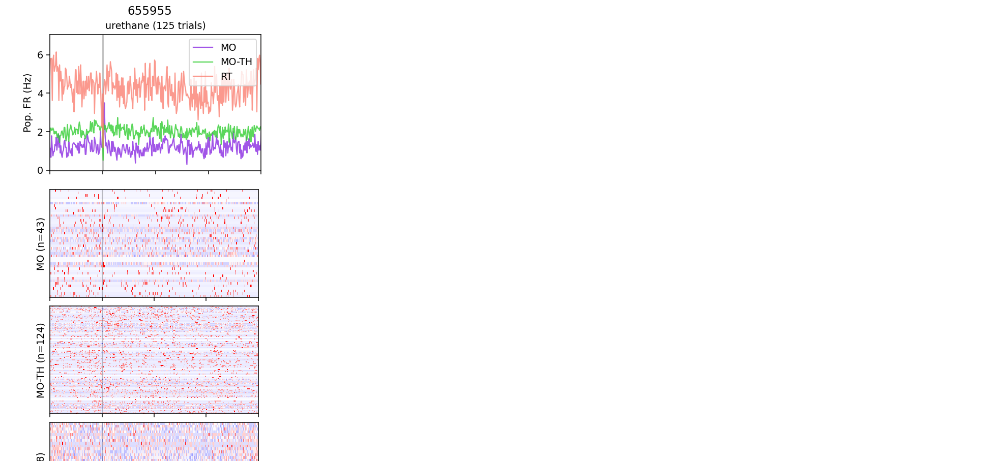

<IPython.core.display.Javascript object>


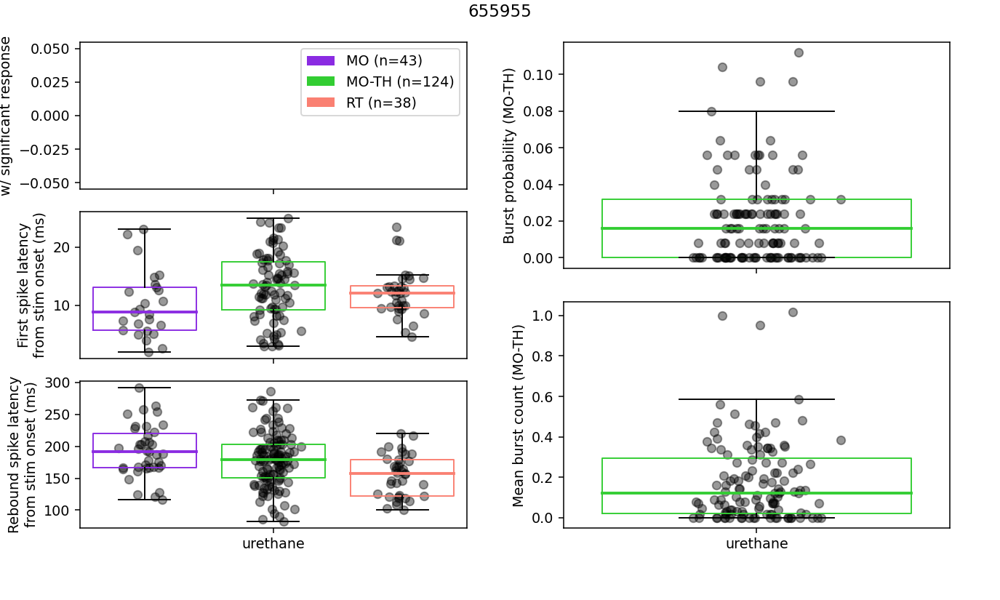

<IPython.core.display.Javascript object>


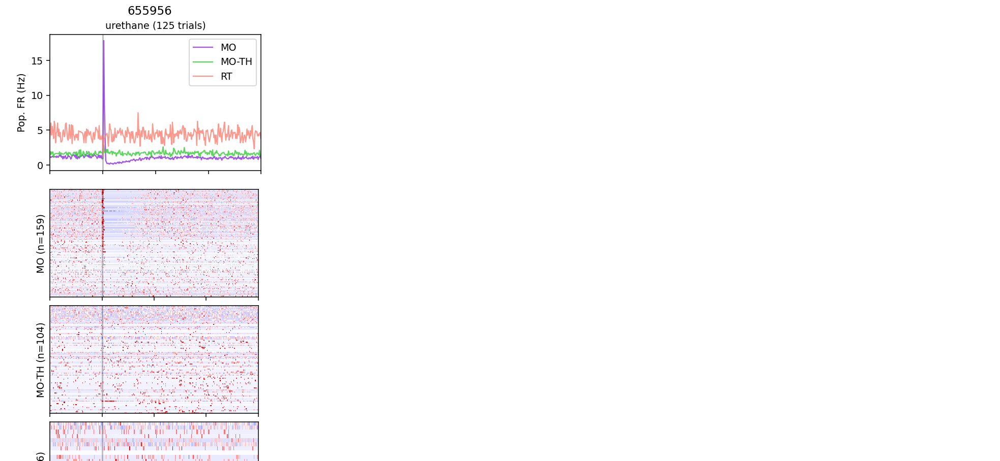

<IPython.core.display.Javascript object>


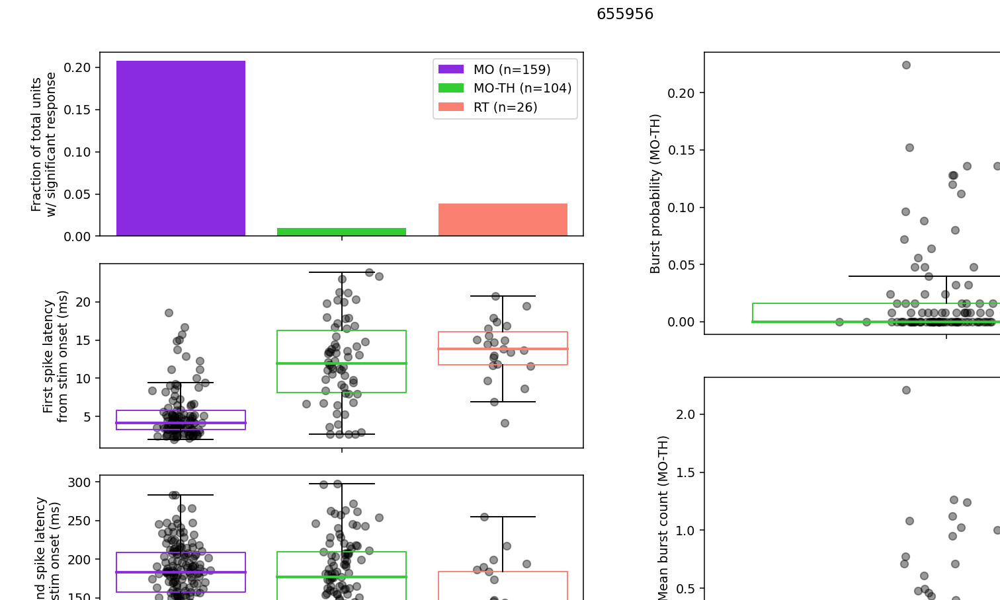

<IPython.core.display.Javascript object>


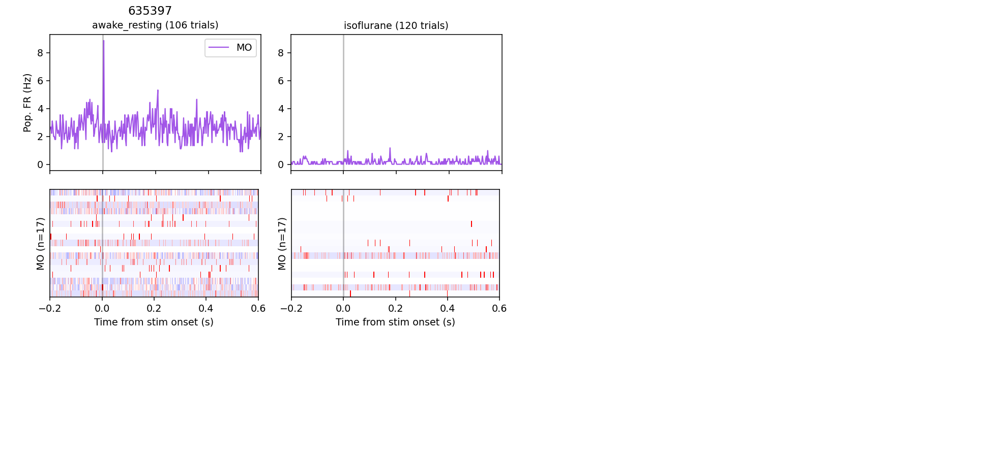

<IPython.core.display.Javascript object>


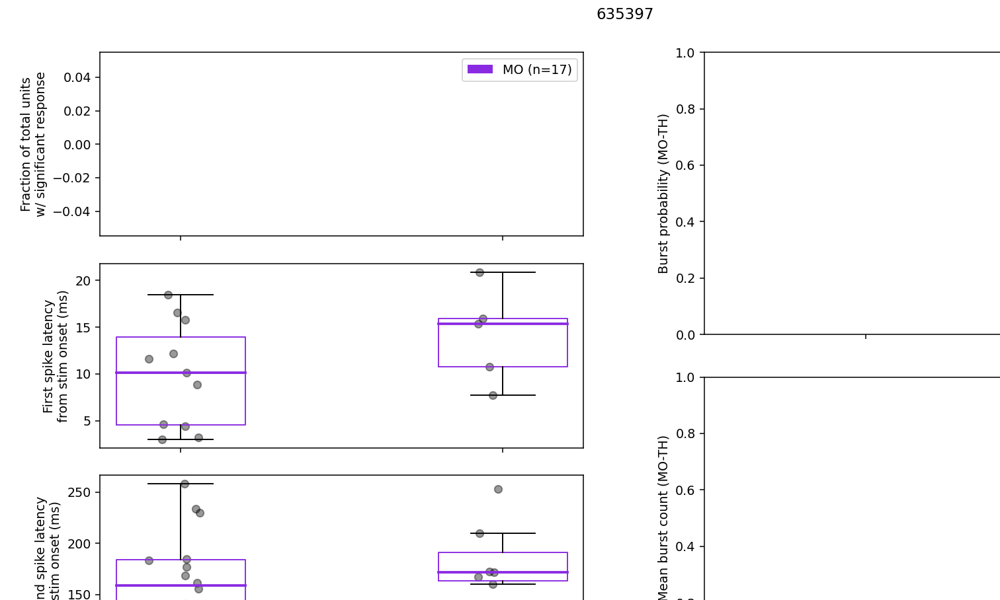

<IPython.core.display.Javascript object>


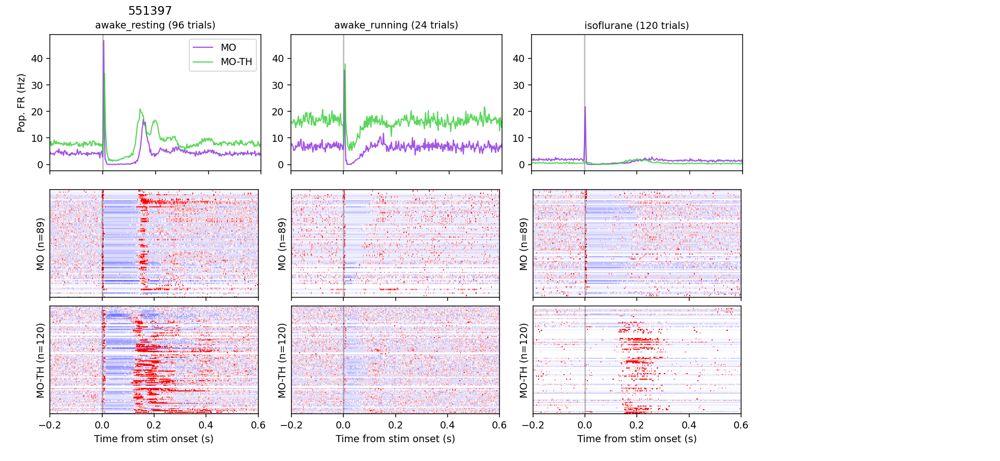

<IPython.core.display.Javascript object>


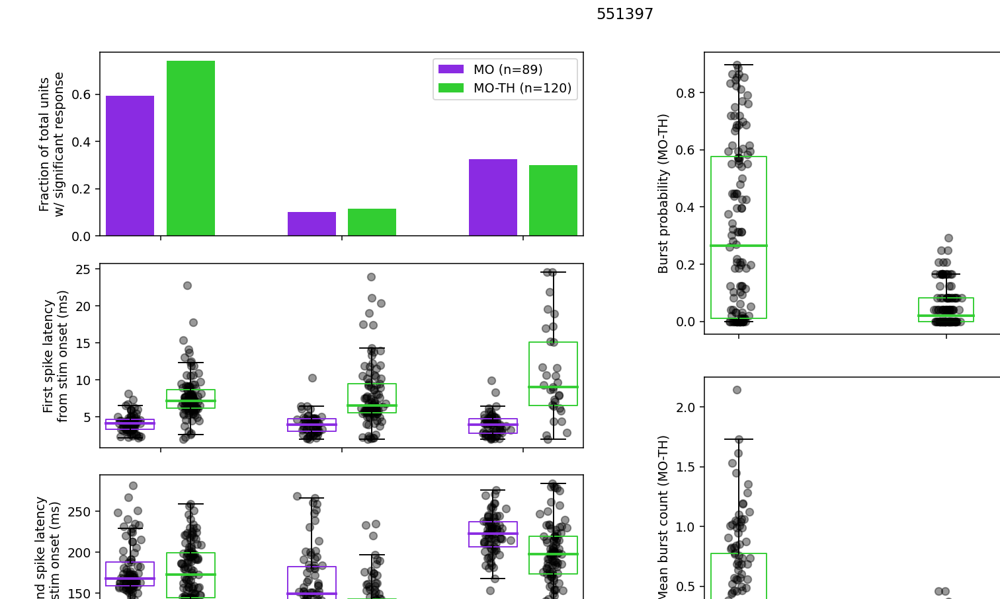

<IPython.core.display.Javascript object>


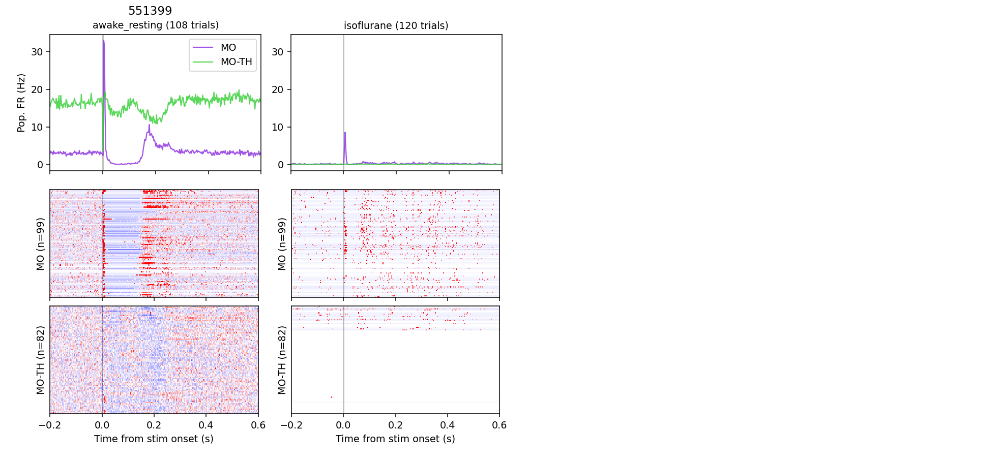

<IPython.core.display.Javascript object>


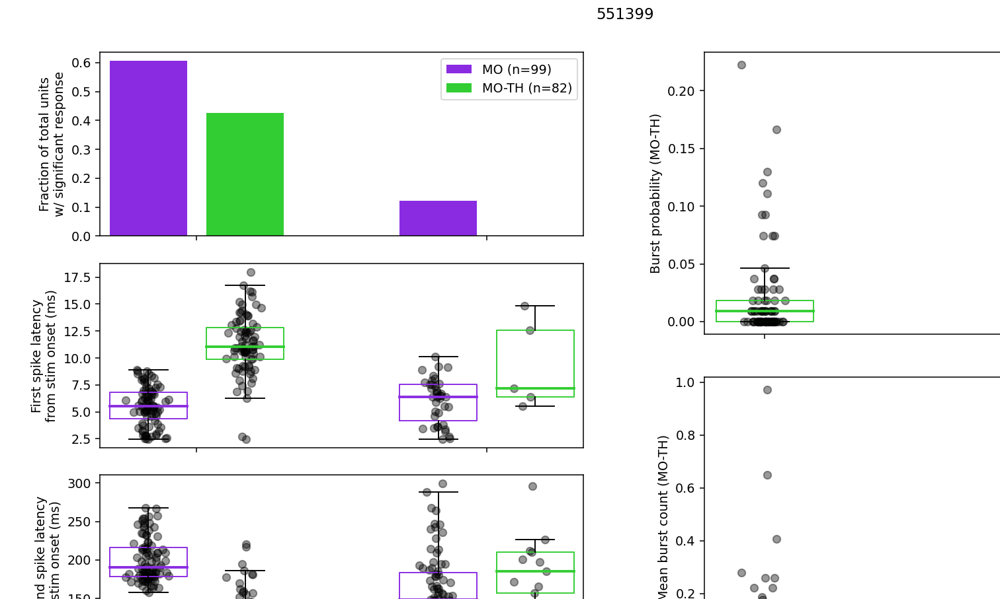

<IPython.core.display.Javascript object>


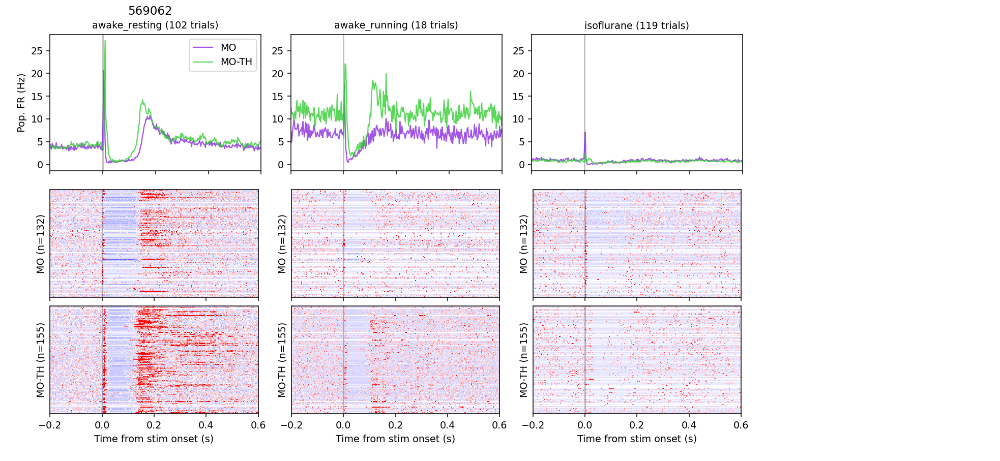

<IPython.core.display.Javascript object>


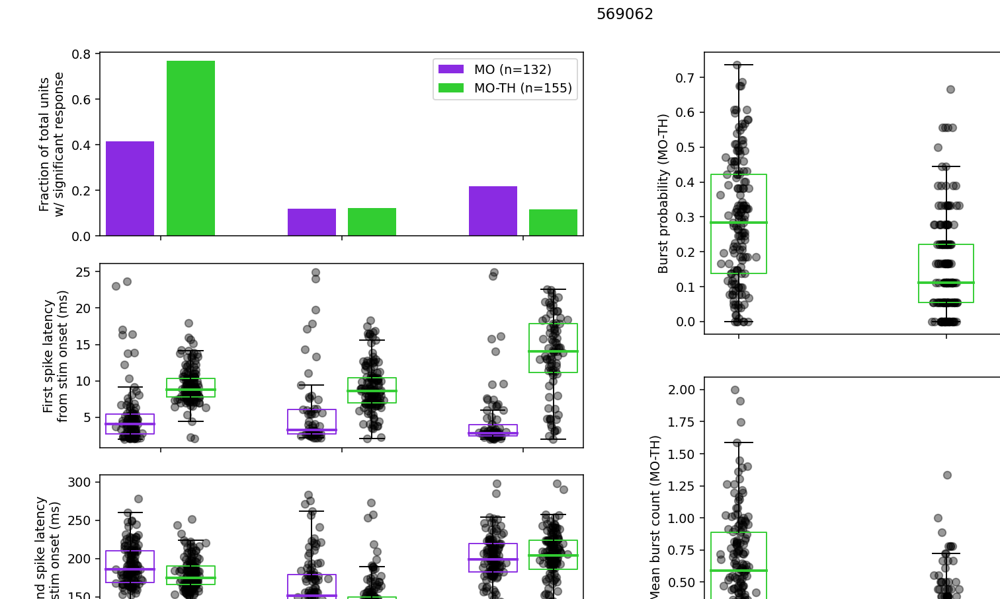

<IPython.core.display.Javascript object>


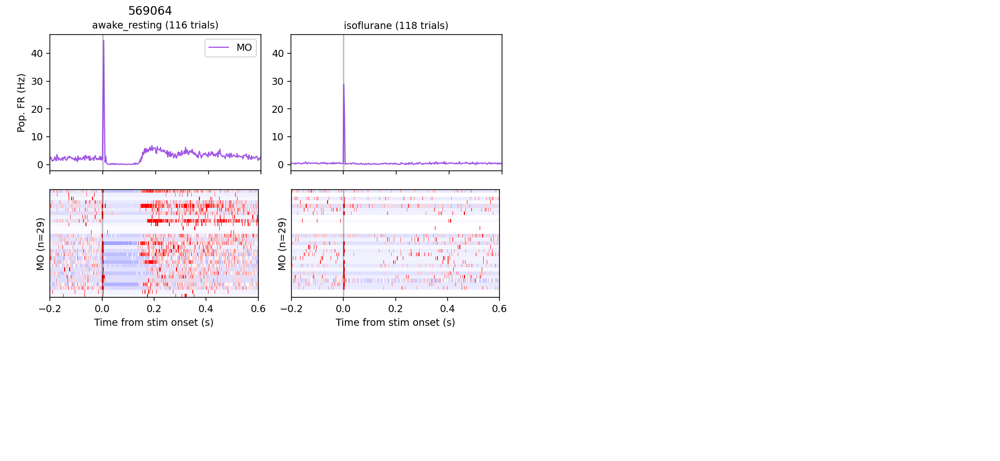

<IPython.core.display.Javascript object>


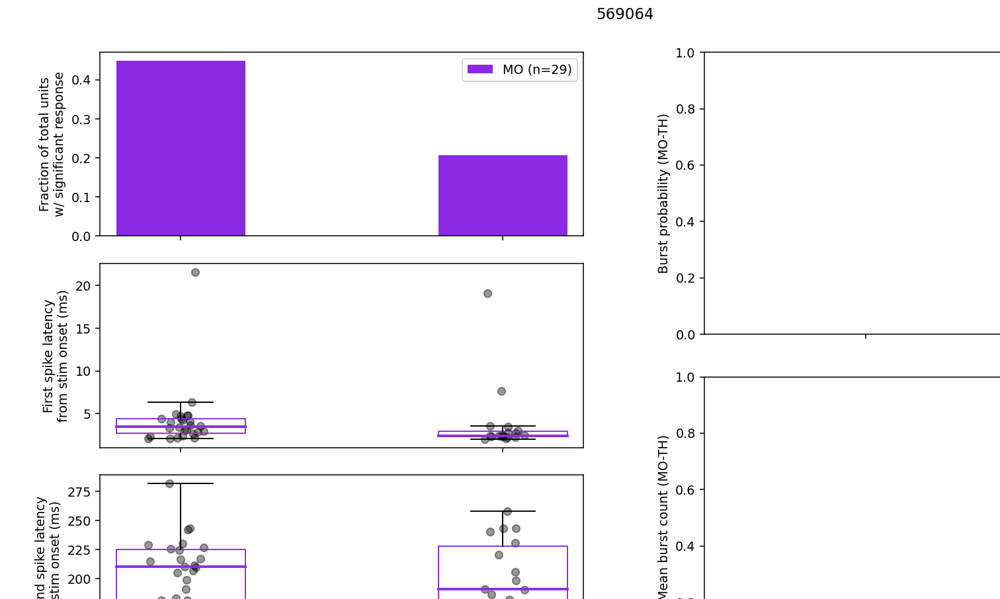

<IPython.core.display.Javascript object>


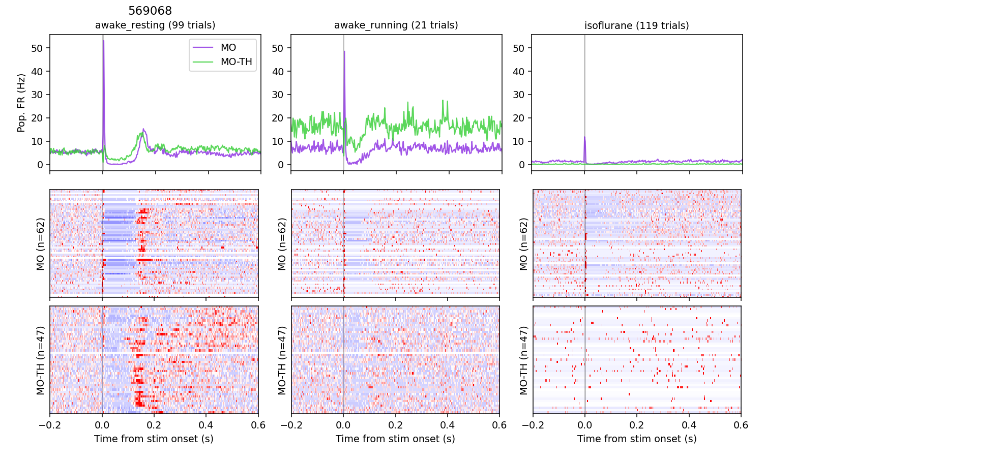

<IPython.core.display.Javascript object>


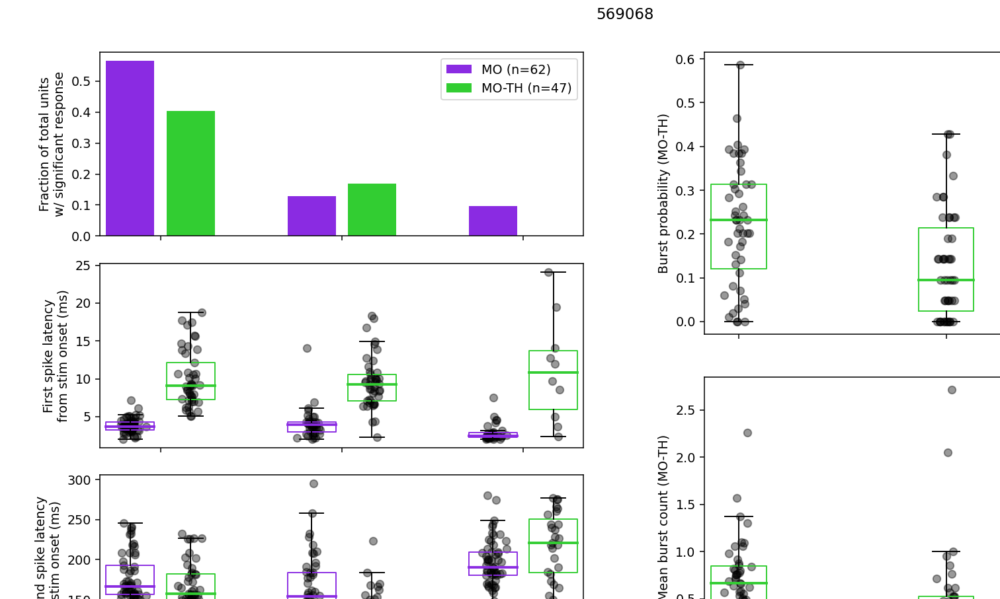

<IPython.core.display.Javascript object>


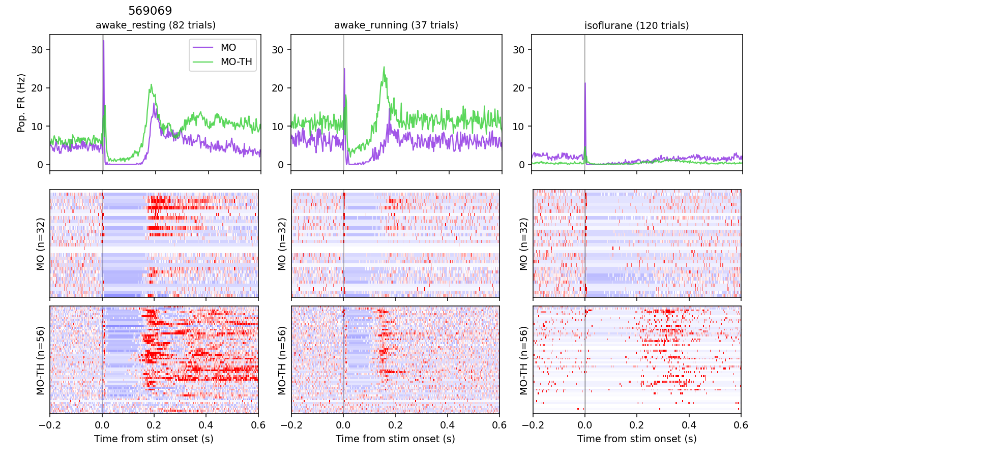

<IPython.core.display.Javascript object>


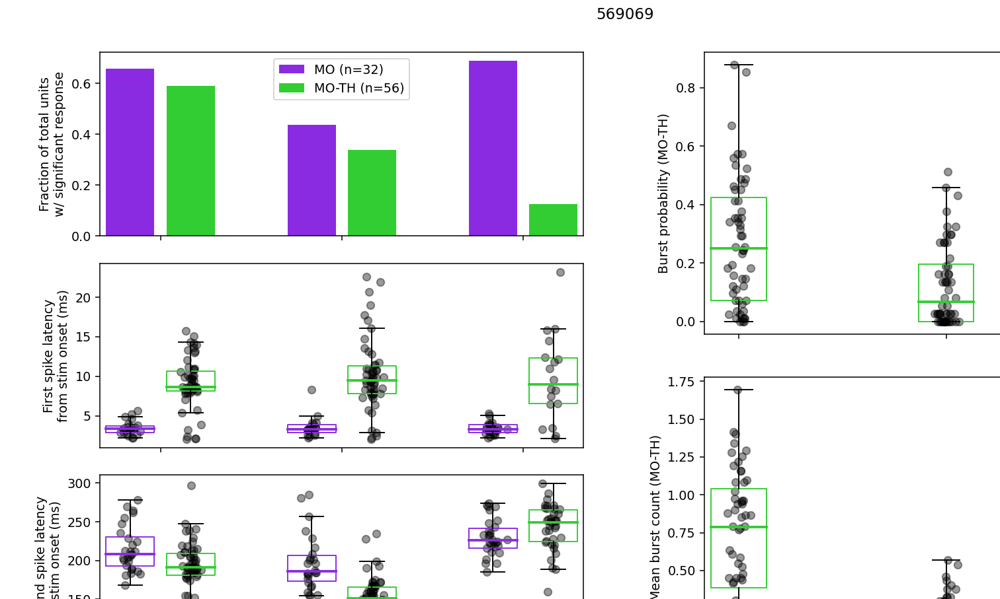

<IPython.core.display.Javascript object>


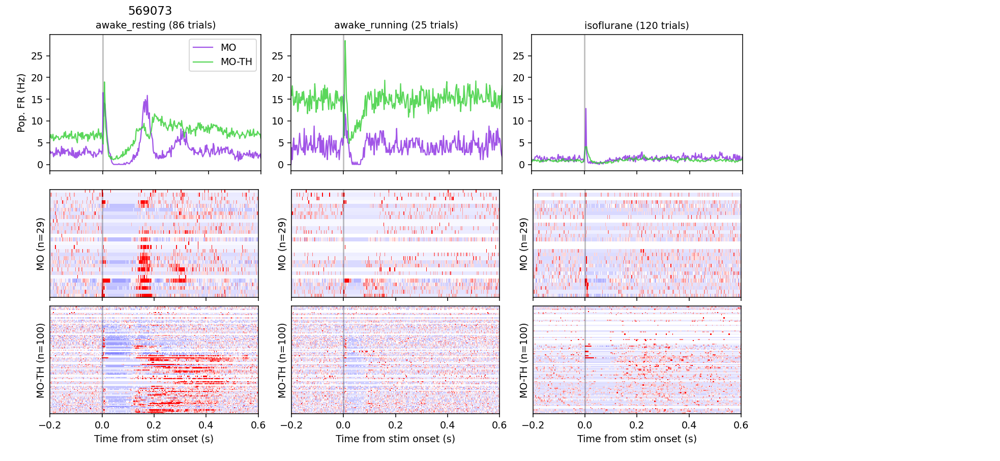

<IPython.core.display.Javascript object>


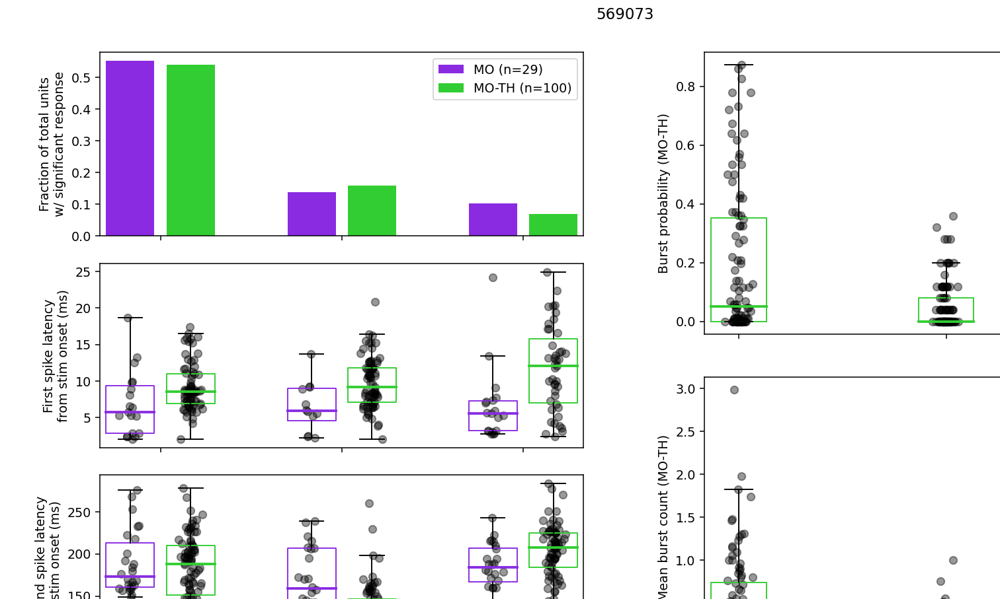

<IPython.core.display.Javascript object>


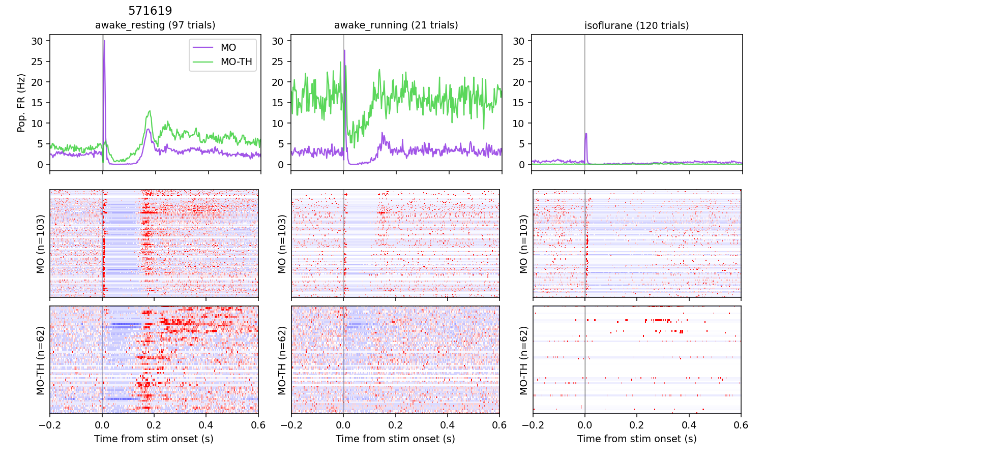

<IPython.core.display.Javascript object>


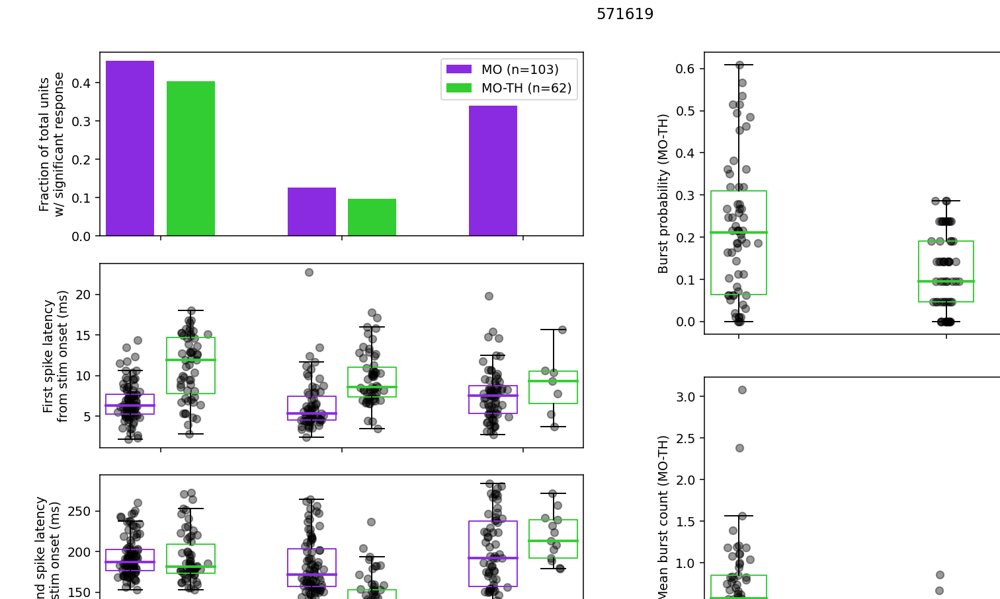

In [24]:
Zlim = 5
plwin = [-0.2, 0.6]
burst_region = 'MO-TH'

for subi, subject_dict in all_subjects_data.items():

    num_states = len(subject_dict['unit_zscores'])
    num_regions = np.max([subject_dict['region_counts'][kk] for kk in subject_dict['region_counts'].keys()])
    if (num_states == 1) & (num_regions == 1):
        print('Not making figures for {}.'.format(subi))
        continue
    pop_firing_rates = subject_dict['pop_fr']

    ### Unit z-scores figure ###
    fig = plt.figure(figsize=(13, 6))
    gs = fig.add_gridspec(
        ncols=1, nrows=2, height_ratios=[1, 2.5], left=0.04, right=0.98, top=0.94, bottom=0.08, hspace=0.08
    )
    popgs = gs[0].subgridspec(ncols=5, nrows=1, wspace=0.14)
    Zgs = gs[1].subgridspec(ncols=5, nrows=3, hspace=0.08, wspace=0.16)

    jj = 0
    for statei in all_states.keys():
        if statei not in subject_dict['unit_zscores'].keys():
            continue
        if jj == 0:
            popax = fig.add_subplot(popgs[jj])
        else:
            popax = fig.add_subplot(popgs[jj], sharey=popax)
        popax.axvline(0, color='k', alpha=0.25)

        ii = 0
        for regi, rcolor in areacolors.items():
            if regi not in subject_dict['unit_zscores'][statei].keys():
                continue
            popax.plot(
                pop_firing_rates[statei][regi][0], pop_firing_rates[statei][regi][1],
                color=rcolor, linewidth=1.2, alpha=0.8, label=regi
            )
            datai = subject_dict['unit_zscores'][statei][regi]
            Zax = fig.add_subplot(Zgs[ii,jj])
            Zax.imshow(
                datai[1].T, cmap='bwr', interpolation='none', aspect='auto', origin='upper', vmin=-Zlim, vmax=Zlim,
                extent=[datai[0][0], datai[0][-1], 0, datai[1].shape[0]],
            )
            Zax.axvline(0, color='k', alpha=0.25)
            Zax.set_ylabel('{} (n={:d})'.format(regi, datai[1].shape[1]))
            Zax.set_yticks([])
            Zax.set_xlim(plwin)
            if ii != subject_dict['region_counts'][statei]-1:
                Zax.set_xticklabels([])
            else:
                Zax.set_xlabel('Time from stim onset (s)')
            ii += 1
        if jj == 0:
            popax.set_ylabel('Pop. FR (Hz)')
            popax.legend()
        popax.set_xlim(plwin)
        popax.set_xticklabels([])
        popax.set_title('{} ({:d} trials)'.format(statei, subject_dict['trial_counts'][statei]))
        jj += 1

    ## Title ##
    fig.text(0.12, 0.98, subi, rotation='horizontal', va='center', ha='center', fontsize=12)
    ## Save ##
    figname = '{}_evoked_unit_zscores_allstates.png'.format(subi)
    fig.savefig(os.path.join(plotsdir, 'ind_sub_evoked_units', figname), transparent=False, dpi=300)



    ### Metrics figure ###
    locs = np.arange((num_regions + 1) * num_states).reshape((num_states, (num_regions + 1)))
    metfig = plt.figure(figsize=(10, 6))
    gs = metfig.add_gridspec(ncols=2, nrows=1, left=0.08, right=0.95, top=0.93, bottom=0.12, wspace=0.25)
    axs = gs[0].subgridspec(ncols=1, nrows=3, hspace=0.15).subplots(sharex=True)
    bxs = gs[1].subgridspec(ncols=1, nrows=2, hspace=0.15).subplots(sharex=True)

    ii = 0
    stlabels2 = []
    for statei in all_states.keys():
        if statei not in subject_dict['unit_metrics'].keys():
            continue
        jj = 0
        for regi, rcolor in areacolors.items():
            if regi not in subject_dict['unit_metrics'][statei].keys():
                continue
            reg_metrics = subject_dict['unit_metrics'][statei][regi]
            total_units = len(reg_metrics)
            xs = np.random.normal(locs[ii,jj], 0.08, total_units)
            ## Fraction of total units that are significantly activated (excited+inhibited) ##
            sig_units = np.sum(reg_metrics['p_value'].values < sigalpha)
            axs[0].bar(locs[ii,jj], sig_units/total_units, color=rcolor)

            ## Early spike latency ##
            early_lats = reg_metrics['early_latency'].values * 1E3
            axs[1].scatter(xs, early_lats, color='k', marker='o', alpha=0.4)
            axs[1].boxplot(
                early_lats[~np.isnan(early_lats)], positions=[locs[ii,jj]], widths=[0.8], showfliers=False, 
                medianprops={'color': rcolor, 'linewidth': 2}, boxprops={'color': rcolor},
            )

            ## Late spike latency ##
            late_lats = reg_metrics['late_latency'].values * 1E3
            axs[2].scatter(xs, late_lats, color='k', marker='o', alpha=0.4)
            axs[2].boxplot(
                late_lats[~np.isnan(late_lats)], positions=[locs[ii,jj]], widths=[0.8], showfliers=False, 
                medianprops={'color': rcolor, 'linewidth': 2}, boxprops={'color': rcolor},
            )

            if regi == burst_region:
                ## Burst probability ##
                bxs[0].scatter(xs, reg_metrics['burst_prob'].values, color='k', marker='o', alpha=0.4)
                bxs[0].boxplot(
                    reg_metrics['burst_prob'].values, positions=[locs[ii,jj]], widths=[0.8], showfliers=False, 
                    medianprops={'color': rcolor, 'linewidth': 2}, boxprops={'color': rcolor},
                )

                ## Burst count ##
                bxs[1].scatter(xs, reg_metrics['burst_count'].values, color='k', marker='o', alpha=0.4)
                bxs[1].boxplot(
                    reg_metrics['burst_count'].values, positions=[locs[ii,jj]], widths=[0.8], showfliers=False, 
                    medianprops={'color': rcolor, 'linewidth': 2}, boxprops={'color': rcolor},
                )
            jj += 1
        if ii == 0:
            regleg = []
            for regi, reg_metrics in subject_dict['unit_metrics'][statei].items():
                regleg.append(Patch(facecolor=areacolors[regi], label='{} (n={:d})'.format(regi, len(reg_metrics))))
            axs[0].legend(handles=regleg)
        templabel = statei.split('_')
        if len(templabel) > 1:
            stlabels2.append(templabel[0] + '\n' + templabel[1])
        else:
            stlabels2.append(templabel[0])
        ii += 1

    axs[0].set_ylabel('Fraction of total units\nw/ significant response')
    axs[1].set_ylabel('First spike latency\nfrom stim onset (ms)')
    axs[2].set_ylabel('Rebound spike latency\nfrom stim onset (ms)')
    axs[2].set_xticks(np.mean(locs[:,:-1], axis=1))
    axs[2].set_xticklabels(stlabels2)

    bxs[0].set_ylabel('Burst probability ({})'.format(burst_region))
    bxs[1].set_ylabel('Mean burst count ({})'.format(burst_region))
    bxs[1].set_xticks(locs[:,1])
    bxs[1].set_xticklabels(stlabels2)

    ## Title ##
    metfig.text(0.5, 0.98, subi, rotation='horizontal', va='center', ha='center', fontsize=12)
    ## Save ##
    mfigname = '{}_unit_metrics_allstates.png'.format(subi)
    metfig.savefig(os.path.join(plotsdir, 'ind_sub_evoked_units', mfigname), transparent=False, dpi=300)

In [33]:
subi

'569070'

## Make multi-sub figure

In [17]:
all_subs_unit_stats_df.head()

,mouse,exp_type,state,trial_count,region,num_units,baselineFR,fraction_sig,burst_prob,burst_count,early_latency,late_latency
0,666193,psilocybin,psilocybin_resting,125,MO,147,2.711184,0.537415,0.000,0.011864,0.004445,0.209095
1,666193,psilocybin,psilocybin_resting,125,MO-TH,211,7.152284,0.431280,0.016,0.127393,0.011439,0.169429
2,666193,psilocybin,psilocybin_running,125,MO,147,4.140299,0.312925,0.000,0.012136,0.004212,0.171596
3,666193,psilocybin,psilocybin_running,125,MO-TH,211,13.038692,0.151659,0.000,0.062408,0.011583,0.125673
4,666194,psilocybin,psilocybin_resting,125,MO,9,2.361778,0.444444,0.000,0.004444,0.007217,0.200856


In [18]:
all_subs_unit_stats_df['early_latency'] = all_subs_unit_stats_df['early_latency'] * 1E3
all_subs_unit_stats_df['late_latency'] = all_subs_unit_stats_df['late_latency'] * 1E3

In [19]:
all_states = {
    'awake_resting': 'o', 'awake_running': 'X',
    'psilocybin_resting': 's', 'psilocybin_running': 'P',
    'isoflurane': '^', 'urethane': 'v',
}
stlabels = ['AW\nrest', 'AW\nrun', 'PSI\nrest', 'PSI\nrun', 'ISO', 'UR']

In [20]:
metric_dict = {
    'baselineFR': ['Baseline firing rate', '(Hz)'],
    'fraction_sig': ['Significant response', 'Fraction of pop.'],
    'early_latency': ['First spike latency', 'Time from stim (ms)'],
    'late_latency': ['Rebound spike latency', 'Time from stim (ms)'],
    'burst_prob': ['Burst probability', 'Fraction of trials'],
    'burst_count': ['Burst count', 'Mean evoked\nburst count'],
}

<IPython.core.display.Javascript object>


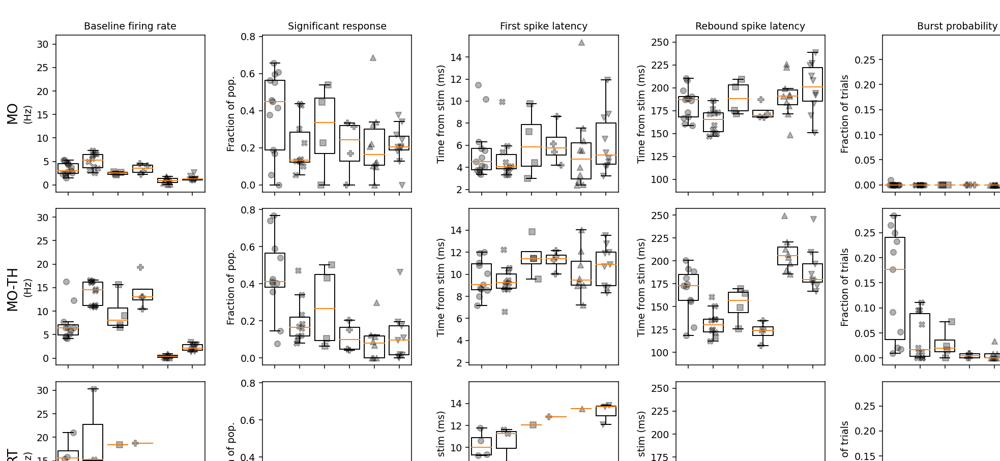

In [21]:
## Figure 1, all areas separate ##
fig, axs = plt.subplots(nrows=len(areas_of_interest), ncols=len(metric_dict), figsize=(13, 6), sharex=True, sharey='col')
fig.set_tight_layout({'rect': [0.01, 0, 1, 0.98]})

for ii, regi in enumerate(areas_of_interest.keys()):
    for kk, (statei, stmarker) in enumerate(all_states.items()):
        tempdf = all_subs_unit_stats_df[
            (all_subs_unit_stats_df['region'] == regi) & (all_subs_unit_stats_df['state'] == statei)
        ]
        xs = np.random.normal(kk, 0.1, len(tempdf))
        for jj, (met, metinfo) in enumerate(metric_dict.items()):
            axs[ii,jj].boxplot(tempdf[met].values, positions=[kk], widths=[0.8], showfliers=False)
            axs[ii,jj].scatter(xs, tempdf[met].values, c='k', marker=stmarker, alpha=0.3)
            if kk == 0:
                axs[ii,jj].set_ylabel(metinfo[1])
                if ii == 0:
                    axs[ii,jj].set_title(metinfo[0])

axs[0,0].set_xticks(list(range(len(stlabels))))
axs[0,0].set_xticklabels(stlabels)
fig.text(0.005, 0.805, 'MO', va='center', rotation='vertical', fontsize=14)
fig.text(0.005, 0.5, 'MO-TH', va='center', rotation='vertical', fontsize=14)
fig.text(0.005, 0.21, 'RT', va='center', rotation='vertical', fontsize=14)

## Save ##
figname = 'allSUBS_unitmetrics_allstates_regsep.png'
# fig.savefig(os.path.join(plotsdir, figname), transparent=False, dpi=300)

<IPython.core.display.Javascript object>


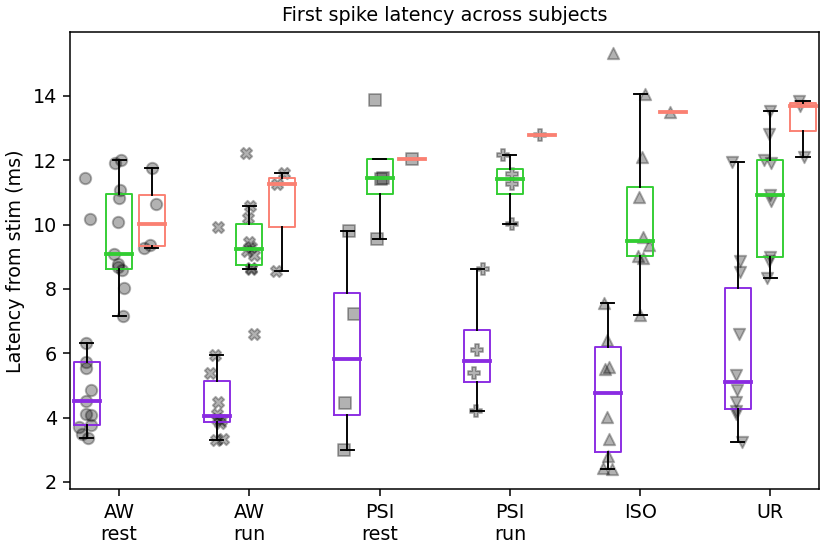

In [22]:
## Fig 2, early latency ##
locs = np.arange((len(areas_of_interest) + 1) * len(stlabels)).reshape((len(stlabels), (len(areas_of_interest) + 1)))
fig, ax = plt.subplots(figsize=(6, 4), constrained_layout=True)

for jj, (regi, rcolor) in enumerate(areacolors.items()):
    for ii, (statei, stmarker) in enumerate(all_states.items()):
        tempdf = all_subs_unit_stats_df[
            (all_subs_unit_stats_df['region'] == regi) & (all_subs_unit_stats_df['state'] == statei)
        ]
        xs = np.random.normal(locs[ii,jj], 0.1, len(tempdf))
        ax.scatter(xs, tempdf['early_latency'].values, c='k', marker=stmarker, alpha=0.3)
        ax.boxplot(
            tempdf['early_latency'].values, positions=[locs[ii,jj]], widths=[0.8], showfliers=False,
            medianprops={'color': rcolor, 'linewidth': 2}, boxprops={'color': rcolor},
        )
ax.set_title('First spike latency across subjects')
ax.set_ylabel('Latency from stim (ms)')
ax.set_xticks(np.mean(locs[:,:-1], axis=1))
ax.set_xticklabels(stlabels)

## Save ##
figname = 'allSUBS_early_latency.png'
fig.savefig(os.path.join(plotsdir, figname), transparent=False, dpi=300)

<IPython.core.display.Javascript object>


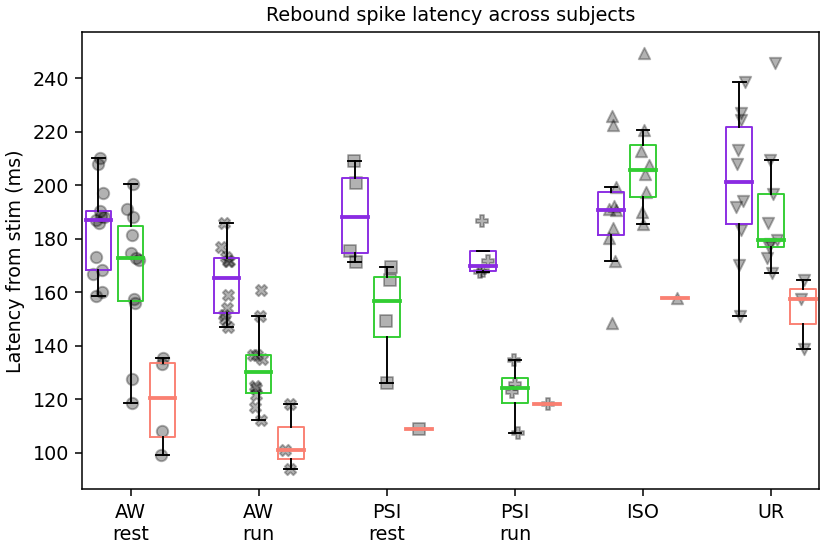

In [23]:
## Fig 3, late latency ##
locs = np.arange((len(areas_of_interest) + 1) * len(stlabels)).reshape((len(stlabels), (len(areas_of_interest) + 1)))
fig, ax = plt.subplots(figsize=(6, 4), constrained_layout=True)

for jj, (regi, rcolor) in enumerate(areacolors.items()):
    for ii, (statei, stmarker) in enumerate(all_states.items()):
        tempdf = all_subs_unit_stats_df[
            (all_subs_unit_stats_df['region'] == regi) & (all_subs_unit_stats_df['state'] == statei)
        ]
        xs = np.random.normal(locs[ii,jj], 0.1, len(tempdf))
        ax.scatter(xs, tempdf['late_latency'].values, c='k', marker=stmarker, alpha=0.3)
        ax.boxplot(
            tempdf['late_latency'].values, positions=[locs[ii,jj]], widths=[0.8], showfliers=False,
            medianprops={'color': rcolor, 'linewidth': 2}, boxprops={'color': rcolor},
        )
ax.set_title('Rebound spike latency across subjects')
ax.set_ylabel('Latency from stim (ms)')
ax.set_xticks(np.mean(locs[:,:-1], axis=1))
ax.set_xticklabels(stlabels)

## Save ##
figname = 'allSUBS_rebound_latency.png'
fig.savefig(os.path.join(plotsdir, figname), transparent=False, dpi=300)

#### Test plotting each subject

666193: 5 states/3 regions; 669118: 3/2; 655955: 1/3; 657903: 4/1

<IPython.core.display.Javascript object>


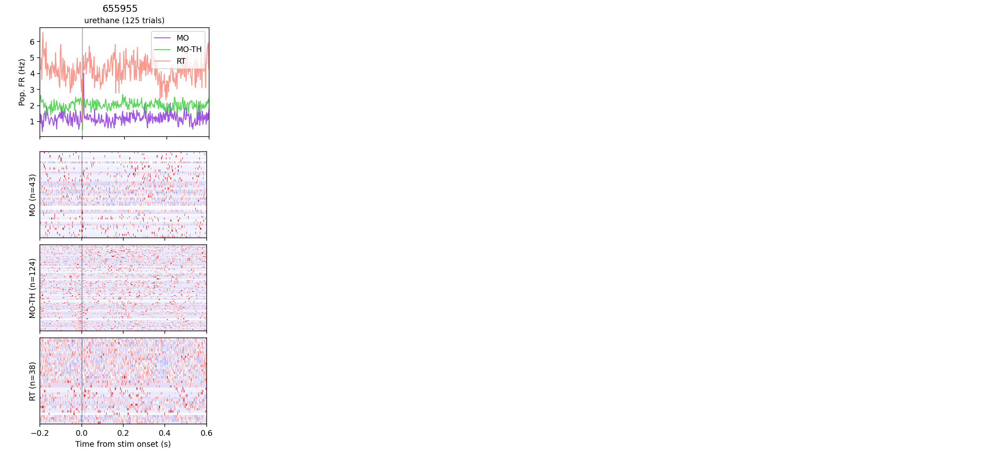

<IPython.core.display.Javascript object>


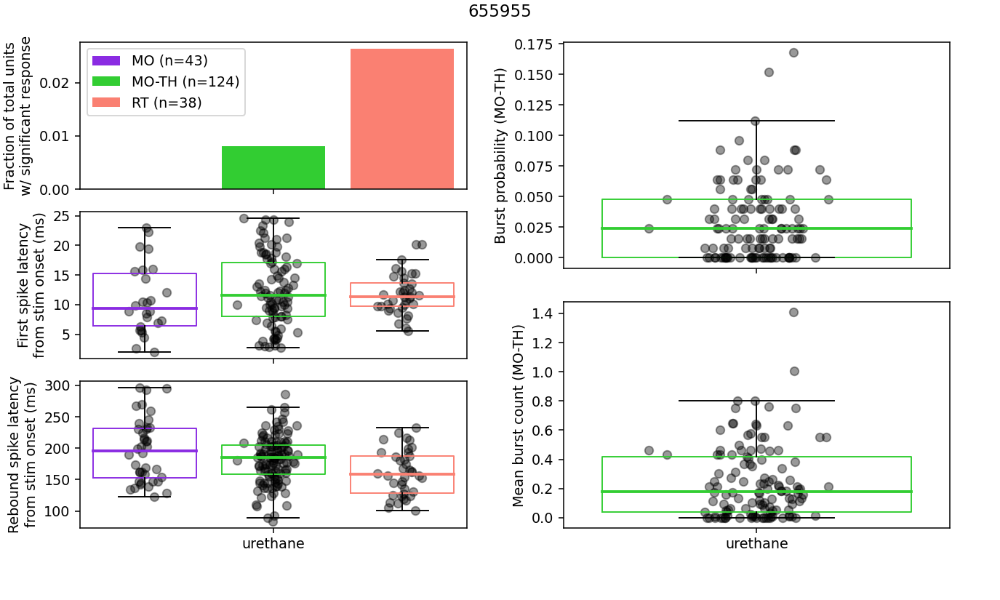

In [117]:
Zlim = 5
plwin = [-0.2, 0.6]
burst_region = 'MO-TH'

subi = '655955'
subject_dict = all_subjects_data[subi]

num_states = len(subject_dict['unit_zscores'])
num_regions = np.max([subject_dict['region_counts'][kk] for kk in subject_dict['region_counts'].keys()])
if (num_states == 1) & (num_regions == 1):
    print('Not making figures for {}.'.format(subi))
pop_firing_rates = subject_dict['pop_fr']

### Unit z-scores figure ###
fig = plt.figure(figsize=(13, 6))
gs = fig.add_gridspec(ncols=1, nrows=2, height_ratios=[1, 2.5], left=0.04, right=0.98, top=0.94, bottom=0.08, hspace=0.08)
popgs = gs[0].subgridspec(ncols=5, nrows=1, wspace=0.14)
Zgs = gs[1].subgridspec(ncols=5, nrows=3, hspace=0.08, wspace=0.16)

jj = 0
for statei in all_states.keys():
    if statei not in subject_dict['unit_zscores'].keys():
        continue
    if jj == 0:
        popax = fig.add_subplot(popgs[jj])
    else:
        popax = fig.add_subplot(popgs[jj], sharey=popax)
    popax.axvline(0, color='k', alpha=0.25)
    
    ii = 0
    for regi, rcolor in areacolors.items():
        if regi not in subject_dict['unit_zscores'][statei].keys():
            continue
        popax.plot(
            pop_firing_rates[statei][regi][0], pop_firing_rates[statei][regi][1],
            color=rcolor, linewidth=1.2, alpha=0.8, label=regi
        )
        datai = subject_dict['unit_zscores'][statei][regi]
        Zax = fig.add_subplot(Zgs[ii,jj])
        Zax.imshow(
            datai[1].T, cmap='bwr', interpolation='none', aspect='auto', origin='upper', vmin=-Zlim, vmax=Zlim,
            extent=[datai[0][0], datai[0][-1], 0, datai[1].shape[0]],
        )
        Zax.axvline(0, color='k', alpha=0.25)
        Zax.set_ylabel('{} (n={:d})'.format(regi, datai[1].shape[1]))
        Zax.set_yticks([])
        Zax.set_xlim(plwin)
        if ii != subject_dict['region_counts'][statei]-1:
            Zax.set_xticklabels([])
        else:
            Zax.set_xlabel('Time from stim onset (s)')
        ii += 1
    if jj == 0:
        popax.set_ylabel('Pop. FR (Hz)')
        popax.legend()
    popax.set_xlim(plwin)
    popax.set_xticklabels([])
    popax.set_title('{} ({:d} trials)'.format(statei, subject_dict['trial_counts'][statei]))
    jj += 1
        
## Title ##
fig.text(0.12, 0.98, subi, rotation='horizontal', va='center', ha='center', fontsize=12)
## Save ##
figname = '{}_evoked_unit_zscores_allstates.png'.format(subi)
# fig.savefig(os.path.join(plotsdir, 'ind_sub_evoked_units', figname), transparent=False, dpi=300)



### Metrics figure ###
locs = np.arange((num_regions + 1) * num_states).reshape((num_states, (num_regions + 1)))
metfig = plt.figure(figsize=(10, 6))
gs = metfig.add_gridspec(ncols=2, nrows=1, left=0.08, right=0.95, top=0.93, bottom=0.12, wspace=0.25)
axs = gs[0].subgridspec(ncols=1, nrows=3, hspace=0.15).subplots(sharex=True)
bxs = gs[1].subgridspec(ncols=1, nrows=2, hspace=0.15).subplots(sharex=True)

ii = 0
stlabels2 = []
for statei in all_states.keys():
    if statei not in subject_dict['unit_metrics'].keys():
        continue
    jj = 0
    for regi, rcolor in areacolors.items():
        if regi not in subject_dict['unit_metrics'][statei].keys():
            continue
        reg_metrics = subject_dict['unit_metrics'][statei][regi]
        total_units = len(reg_metrics)
        xs = np.random.normal(locs[ii,jj], 0.08, total_units)
        ## Fraction of total units that are significantly activated (excited+inhibited) ##
        sig_units = np.sum(reg_metrics['p_value'].values < sigalpha)
        axs[0].bar(locs[ii,jj], sig_units/total_units, color=rcolor)

        ## Early spike latency ##
        early_lats = reg_metrics['early_latency'].values * 1E3
        axs[1].scatter(xs, early_lats, color='k', marker='o', alpha=0.4)
        axs[1].boxplot(
            early_lats[~np.isnan(early_lats)], positions=[locs[ii,jj]], widths=[0.8], showfliers=False, 
            medianprops={'color': rcolor, 'linewidth': 2}, boxprops={'color': rcolor},
        )

        ## Late spike latency ##
        late_lats = reg_metrics['late_latency'].values * 1E3
        axs[2].scatter(xs, late_lats, color='k', marker='o', alpha=0.4)
        axs[2].boxplot(
            late_lats[~np.isnan(late_lats)], positions=[locs[ii,jj]], widths=[0.8], showfliers=False, 
            medianprops={'color': rcolor, 'linewidth': 2}, boxprops={'color': rcolor},
        )

        if regi == burst_region:
            ## Burst probability ##
            bxs[0].scatter(xs, reg_metrics['burst_prob'].values, color='k', marker='o', alpha=0.4)
            bxs[0].boxplot(
                reg_metrics['burst_prob'].values, positions=[locs[ii,jj]], widths=[0.8], showfliers=False, 
                medianprops={'color': rcolor, 'linewidth': 2}, boxprops={'color': rcolor},
            )

            ## Burst count ##
            bxs[1].scatter(xs, reg_metrics['burst_count'].values, color='k', marker='o', alpha=0.4)
            bxs[1].boxplot(
                reg_metrics['burst_count'].values, positions=[locs[ii,jj]], widths=[0.8], showfliers=False, 
                medianprops={'color': rcolor, 'linewidth': 2}, boxprops={'color': rcolor},
            )
        jj += 1
    if ii == 0:
        regleg = []
        for regi, reg_metrics in subject_dict['unit_metrics'][statei].items():
            regleg.append(Patch(facecolor=areacolors[regi], label='{} (n={:d})'.format(regi, len(reg_metrics))))
        axs[0].legend(handles=regleg)
    templabel = statei.split('_')
    if len(templabel) > 1:
        stlabels2.append(templabel[0] + '\n' + templabel[1])
    else:
        stlabels2.append(templabel[0])
    ii += 1

axs[0].set_ylabel('Fraction of total units\nw/ significant response')
axs[1].set_ylabel('First spike latency\nfrom stim onset (ms)')
axs[2].set_ylabel('Rebound spike latency\nfrom stim onset (ms)')
axs[2].set_xticks(np.mean(locs[:,:-1], axis=1))
axs[2].set_xticklabels(stlabels2)

bxs[0].set_ylabel('Burst probability ({})'.format(burst_region))
bxs[1].set_ylabel('Mean burst count ({})'.format(burst_region))
bxs[1].set_xticks(locs[:,1])
bxs[1].set_xticklabels(stlabels2)

## Title ##
metfig.text(0.5, 0.98, subi, rotation='horizontal', va='center', ha='center', fontsize=12)
## Save ##
mfigname = '{}_unit_metrics_allstates.png'.format(subi)
# metfig.savefig(os.path.join(plotsdir, 'ind_sub_evoked_units', mfigname), transparent=False, dpi=300)

## Testing metrics on single subjects with plots

In [15]:
skip_states = ['recovery']
psilocybin_window = 90 * 60 # min to include as "psilocybin" -> seconds
substates = {'resting': True, 'running': False}
trial_threshold = 18 # must have more than this number of trials to be included in analysis
trial_max = 125 # limit some states that have many trials
unit_threshold = 5 # must have st least this number of units to be included in analysis
time_bin = 0.0025 # size of time bins (s) for firing rate

sig_test_window = [0.0, 0.3]
sigalpha = 0.05 # significance threshold for unit activation
burst_window = [0.075, 0.3]
early_window = [0.002, 0.025]
late_window = [0.075, 0.3]

In [16]:
subrow = subject_df.iloc[4]
print(subrow.mouse)

if not subrow.analyze:
    print('Skipping {} - {} for now, missing data.\n'.format(subrow.mouse, subrow.exp_type))

669118


Add state and stim depth info to stim_log and get stim current for analysis

In [17]:
## Load EEGexp and stim_log ##
exp = EEGexp(subrow.data_loc, preprocess=False, make_stim_csv=False)
stim_log = pd.read_csv(exp.stimulus_log_file).astype({'parameter': str})

### Get all states in experiment ###
all_sweeps = np.unique(stim_log['sweep'].values)

## Get state label for each sweep ##
sweep_state_list = []
for char in subrow.sweep_states.split(','):
    sweep_state_list.append(char)
if len(sweep_state_list) == 1:
    sweep_state_list = sweep_state_list * len(all_sweeps)
stim_log['state'] = stim_log.apply(lambda x: sweep_state_list[x.sweep], axis=1)
## Get depth label for each sweep ##
sweep_depth_list = []
for char in subrow.stim_depth.split(','):
    sweep_depth_list.append(char)
if len(sweep_depth_list) == 1:
    sweep_depth_list = sweep_depth_list * len(all_sweeps)
stim_log['stim_depth'] = stim_log.apply(lambda x: sweep_depth_list[x.sweep], axis=1)
## Get list of states and the middle current ##
states = np.unique(stim_log['state'].values)
currents = np.unique(stim_log[stim_log['stim_type'] == 'biphasic']['parameter'].values).astype(int)
if len(currents) > 1:
    ch_curr = str(currents[1])
else:
    ch_curr = str(currents[0])
    
print(states)

Experiment type: electrical stimulation
['awake' 'psilocybin']


Add area of interest tag to all-units info

In [18]:
## Load unit info ##
fn_units_info = os.path.join(exp.data_folder, 'evoked_data', 'all_units_info.csv')
if os.path.exists(fn_units_info):
    unit_info = pd.read_csv(fn_units_info)
    with open(os.path.join(exp.data_folder, 'evoked_data', 'units_event_spikes.pkl'), 'rb') as unit_file:
        all_unit_event_spikes = pickle.load(unit_file)
else:
    print('{} not found. Not analyzing this subject.'.format(fn_units_stats))
#     continue

## Make time bins for event spikes ##
bins = np.arange(all_unit_event_spikes['event_window'][0], all_unit_event_spikes['event_window'][1] + time_bin, time_bin)
timex = bins[:-1] + time_bin/2

### Add parent region to df ###
parent_list = []
for regi in unit_info['region'].values:
    parent_region = [key for key in list(areas_of_interest.keys()) if regi in areas_of_interest[key]]
    if len(parent_region) == 1:
        parent_list.append(parent_region[0])
    else:
        parent_list.append('notROI')
unit_info['parent'] = parent_list

unit_info.head()

,unit_id,probe,peak_ch,depth,spike_duration,region,CCF_AP,CCF_DV,CCF_ML,parent
0,B2,probeB,0,3700,0.467002,VAL,260,179,179,MO-TH
1,B3,probeB,1,3700,0.549414,VAL,260,179,179,MO-TH
2,B6,probeB,1,3700,0.425796,VAL,260,179,179,MO-TH
3,B9,probeB,2,3680,0.480737,VAL,260,178,179,MO-TH
4,B10,probeB,4,3660,0.480737,VAL,260,177,179,MO-TH


In [19]:
ROI_unit_info = {}
for region in areas_of_interest.keys():
    udf = unit_info[unit_info['parent'] == region]
    if len(udf) >= unit_threshold:
        ROI_unit_info[region] = udf.sort_values(by='depth').reset_index(drop=True)
        print('{}: {:d} units'.format(region, len(udf)))

MO: 7 units
MO-TH: 62 units


Get eventinds

In [20]:
state_event_inds = {}
for statei in states:
    if statei in skip_states:
        print('Skipping {}.'.format(statei))
        continue
    if statei == 'psilocybin':
        exp_meta = metadata[(
            (metadata['mouse_name'].str.contains(subrow.mouse)) &
            (metadata['exp_name'].str.contains(subrow.experiment))
        )].squeeze()
        stim_log['onset_from_inj2'] = stim_log['onset'] - float(exp_meta['Second injection time'])
        for substi, trialtest in substates.items():
            eventinds = stim_log[
                (stim_log['stim_type'] == 'biphasic') &
                (stim_log['parameter'] == ch_curr) &
                (stim_log['stim_depth'] == 'deep') &
                (stim_log['good'] == True) &
                (stim_log['resting_trial'] == trialtest) &
                (stim_log['state'] == statei) &
                (stim_log['onset_from_inj2'] < psilocybin_window)
            ].index.values
            state_event_inds[statei + '_' + substi] = eventinds
    elif statei == 'awake':
        for substi, trialtest in substates.items():
            eventinds = stim_log[
                (stim_log['stim_type'] == 'biphasic') &
                (stim_log['parameter'] == ch_curr) &
                (stim_log['stim_depth'] == 'deep') &
                (stim_log['good'] == True) &
                (stim_log['resting_trial'] == trialtest) &
                (stim_log['state'] == statei)
            ].index.values
            state_event_inds[statei + '_' + substi] = eventinds
    else:
        eventinds = stim_log[
            (stim_log['stim_type'] == 'biphasic') &
            (stim_log['parameter'] == ch_curr) &
            (stim_log['stim_depth'] == 'deep') &
            (stim_log['good'] == True) &
            (stim_log['resting_trial'] == True) &
            (stim_log['state'] == statei)
        ].index.values
        state_event_inds[statei] = eventinds
print(state_event_inds.keys())

dict_keys(['awake_resting', 'awake_running', 'psilocybin_resting', 'psilocybin_running'])


In [26]:
unit_metrics = {}
unit_zscores = {}
pop_firing_rates = {}
for statei, event_inds in state_event_inds.items():
    if len(event_inds) < trial_threshold:
        print('Only {:d} trials for {} state, not analyzing.'.format(len(event_inds), statei))
        continue
    elif len(event_inds) > trial_max:
        print('{} has {:d} trials, downsampling trials to {:d}.'.format(statei, len(event_inds), trial_max))
        event_inds = np.random.choice(event_inds, size=trial_max, replace=False)
    unit_metrics[statei] = {}
    unit_zscores[statei] = {}
    pop_firing_rates[statei] = {}
    for regi, regdf in ROI_unit_info.items():

        unit_firing_rates = np.zeros((len(timex), len(regdf)), dtype=float) * np.nan
    #     sig_evoked_units = np.zeros(len(regdf), dtype=int)
    #     burst_trials = np.zeros(len(regdf), dtype=float)
    #     early_spike_latency = np.zeros(len(regdf), dtype=float)
    #     late_spike_latency = np.zeros(len(regdf), dtype=float)

        ## Get unit event spike times ##
        reg_unit_metrics = []
        for ii, unitrow in regdf.iterrows():
            unit_event_spikes = [all_unit_event_spikes['event_spikes'][unitrow.unit_id][ei] for ei in event_inds]
            unit_event_bursts = [all_unit_event_spikes['event_bursts'][unitrow.unit_id]['times'][ei] for ei in event_inds]
            ## Get firing rates ##    
            unit_event_counts, edges = np.histogram(np.concatenate(unit_event_spikes), bins)
            unit_firing_rates[:, ii] = unit_event_counts / (time_bin * len(event_inds))


            prespikes = np.zeros(len(event_inds), dtype=int)
            postspikes = np.zeros(len(event_inds), dtype=int)
            trial_counts = np.zeros(len(event_inds), dtype=int)
            burst_counts = np.zeros(len(event_inds), dtype=int)
            earlyfirstspikes = []
            latefirstspikes = []
            for jj, uspikesi in enumerate(unit_event_spikes):
                ## Count spikes ##
                prespikes[jj] = np.sum((uspikesi >= -sig_test_window[1]) & (uspikesi <= -sig_test_window[0]))
                postspikes[jj] = np.sum((uspikesi >= sig_test_window[0]) & (uspikesi <= sig_test_window[1]))

                ## Count bursts ##
                windowbursts = np.nonzero(
                    (unit_event_bursts[jj] >= burst_window[0]) & (unit_event_bursts[jj] <= burst_window[1]))[0]
                if len(windowbursts) > 0:
                    trial_counts[jj] = 1
                burst_counts[jj] = len(np.nonzero(unit_event_bursts[jj] >= burst_window[0])[0])

                ## Find first spikes ##
                earlyspikes = np.nonzero((uspikesi >= early_window[0]) & (uspikesi <= early_window[1]))[0]
                if len(earlyspikes) > 0:
                    earlyfirstspikes.append(uspikesi[earlyspikes[0]])
                latespikes = np.nonzero((uspikesi >= late_window[0]) & (uspikesi <= late_window[1]))[0]
                if len(latespikes) > 0:
                    latefirstspikes.append(uspikesi[latespikes[0]])

            wstat, pval = stats.wilcoxon(x=postspikes, y=prespikes, zero_method='zsplit')

            reg_unit_metrics.append([
                unitrow.unit_id, pval, np.median(earlyfirstspikes), np.median(latefirstspikes),
                np.mean(trial_counts), np.mean(burst_counts)
            ])
    #         sig_evoked_units[ii] = pval < sigalpha
    #         burst_trials[ii] = np.mean(trial_counts) # fraction of trials with burst
    #         early_spike_latency[ii] = np.median(earlyfirstspikes)
    #         late_spike_latency[ii] = np.median(latefirstspikes)
        unit_metrics_df = regdf.merge(
            pd.DataFrame(reg_unit_metrics,
                         columns=['unit_id', 'p_value', 'early_latency', 'late_latency', 'burst_prob', 'burst_count']),
            on='unit_id', how='left'
        )
        unit_metrics[statei][regi] = unit_metrics_df
        unit_zscores[statei][regi] = [timex, get_zFR(unit_firing_rates, timex)]
        pop_firing_rates[statei][regi] = [timex, np.mean(unit_firing_rates, axis=1)]

Only 3 trials for awake_resting state, not analyzing.
psilocybin_running has 997 trials, downsampling trials to 125.


##### Make some plots

<IPython.core.display.Javascript object>


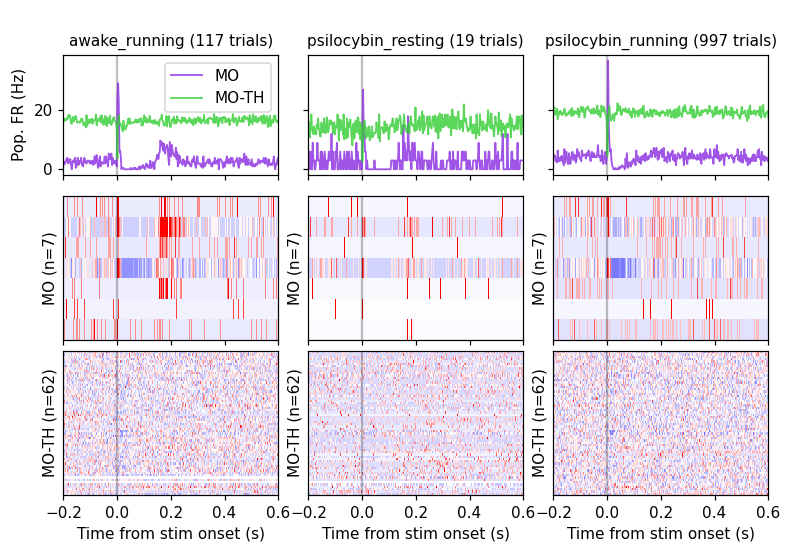

In [27]:
Zlim = 5
plwin = [-0.2, 0.6]

fig = plt.figure(figsize=(len(unit_zscores)*2.4, 5))
gs = fig.add_gridspec(ncols=1, nrows=2, height_ratios=[1, 2.5], left=0.08, right=0.97, top=0.9, bottom=0.1, hspace=0.1)
popaxs = gs[0].subgridspec(ncols=len(unit_zscores), nrows=1, wspace=0.14).subplots(sharex=True, sharey=True)
Zaxs = gs[1].subgridspec(ncols=len(unit_zscores), nrows=len(ROI_unit_info), hspace=0.08, wspace=0.14).subplots(sharex=True)

for jj, (statei, statedict) in enumerate(unit_zscores.items()):
    popaxs[jj].axvline(0, color='k', alpha=0.25)
    for ii, (regi, datai) in enumerate(statedict.items()):
        popaxs[jj].plot(
            pop_firing_rates[statei][regi][0], pop_firing_rates[statei][regi][1],
            color=areacolors[regi], linewidth=1.2, alpha=0.8, label=regi
        )
        imunit = Zaxs[ii,jj].imshow(
            datai[1].T, cmap='bwr', interpolation='none', aspect='auto', origin='upper', vmin=-Zlim, vmax=Zlim,
            extent=[datai[0][0], datai[0][-1], 0, datai[1].shape[0]],
        )
        Zaxs[ii,jj].axvline(0, color='k', alpha=0.25)
        Zaxs[ii,jj].set_ylabel('{} (n={:d})'.format(regi, datai[1].shape[1]))
        Zaxs[ii,jj].set_yticks([])

    Zaxs[ii,jj].set_xlim(plwin)
    Zaxs[ii,jj].set_xlabel('Time from stim onset (s)')

    popaxs[jj].set_xlim(plwin)
    popaxs[jj].set_xticklabels([])
    popaxs[jj].set_title('{} ({:d} trials)'.format(statei, len(state_event_inds[statei])))
popaxs[0].set_ylabel('Pop. FR (Hz)')
popaxs[0].legend()

<IPython.core.display.Javascript object>


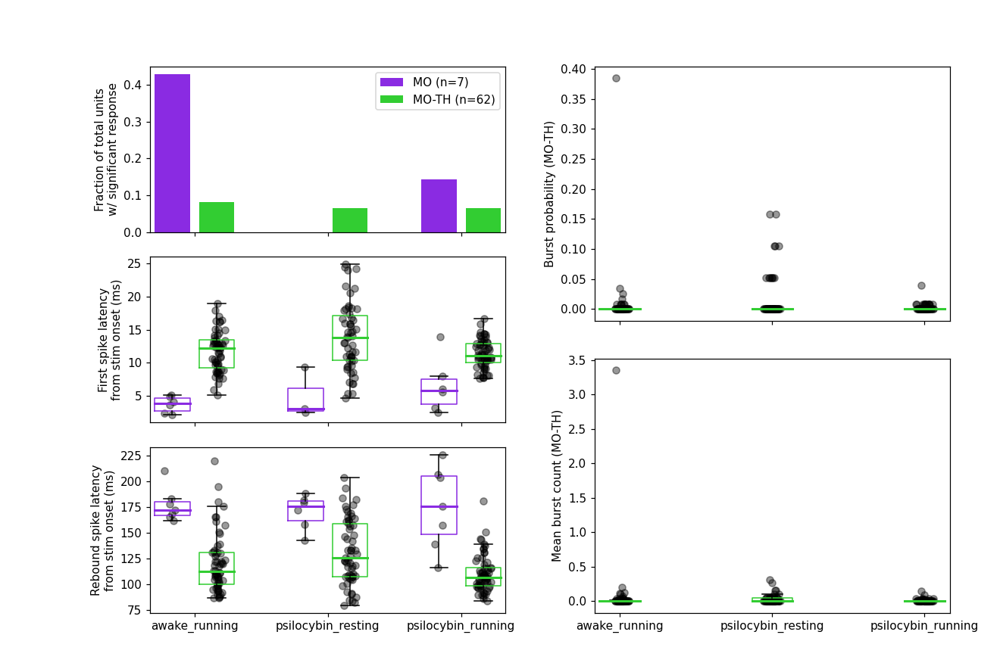

[Text(1, 0, 'awake_running'),
 Text(4, 0, 'psilocybin_resting'),
 Text(7, 0, 'psilocybin_running')]

In [28]:
locs = np.arange((len(ROI_unit_info) + 1) * len(unit_metrics)).reshape((len(unit_metrics), (len(ROI_unit_info) + 1)))
burst_region = 'MO-TH'

fig = plt.figure(figsize=(12, 8))
gs = fig.add_gridspec(ncols=2, nrows=1, left=0.15, right=0.95, top=0.9, bottom=0.08, wspace=0.25)
axs = gs[0].subgridspec(ncols=1, nrows=3, hspace=0.15).subplots(sharex=True)
bxs = gs[1].subgridspec(ncols=1, nrows=2, hspace=0.15).subplots(sharex=True)

for ii, (statei, statemets) in enumerate(unit_metrics.items()):
    for jj, (regi, reg_metrics) in enumerate(statemets.items()):
        total_units = len(reg_metrics)
        xs = np.random.normal(locs[ii,jj], 0.08, total_units)
        ## Fraction of total units that are significantly activated (excited+inhibited) ##
        sig_units = np.sum(reg_metrics['p_value'].values < sigalpha)
        axs[0].bar(locs[ii,jj], sig_units/total_units, color=areacolors[regi])
        
        ## Early spike latency ##
        early_lats = reg_metrics['early_latency'].values * 1E3
        axs[1].scatter(xs, early_lats, color='k', marker='o', alpha=0.4)
        axs[1].boxplot(
            early_lats[~np.isnan(early_lats)], positions=[locs[ii,jj]], widths=[0.8], showfliers=False, 
            medianprops={'color': areacolors[regi], 'linewidth': 2}, boxprops={'color': areacolors[regi]},
        )
        
        ## Late spike latency ##
        late_lats = reg_metrics['late_latency'].values * 1E3
        axs[2].scatter(xs, late_lats, color='k', marker='o', alpha=0.4)
        axs[2].boxplot(
            late_lats[~np.isnan(late_lats)], positions=[locs[ii,jj]], widths=[0.8], showfliers=False, 
            medianprops={'color': areacolors[regi], 'linewidth': 2}, boxprops={'color': areacolors[regi]},
        )
        
        if regi == burst_region:
            ## Burst probability ##
            bxs[0].scatter(xs, reg_metrics['burst_prob'].values, color='k', marker='o', alpha=0.4)
            bxs[0].boxplot(
                reg_metrics['burst_prob'].values, positions=[locs[ii,jj]], widths=[0.8], showfliers=False, 
                medianprops={'color': areacolors[regi], 'linewidth': 2}, boxprops={'color': areacolors[regi]},
            )
            
            ## Burst count ##
            bxs[1].scatter(xs, reg_metrics['burst_count'].values, color='k', marker='o', alpha=0.4)
            bxs[1].boxplot(
                reg_metrics['burst_count'].values, positions=[locs[ii,jj]], widths=[0.8], showfliers=False, 
                medianprops={'color': areacolors[regi], 'linewidth': 2}, boxprops={'color': areacolors[regi]},
            )
            
        
axs[0].set_ylabel('Fraction of total units\nw/ significant response')
axs[1].set_ylabel('First spike latency\nfrom stim onset (ms)')
axs[2].set_ylabel('Rebound spike latency\nfrom stim onset (ms)')
axs[2].set_xticks(np.mean(locs[:,:-1], axis=1))
axs[2].set_xticklabels(unit_metrics.keys())

regleg = []
for regi, reg_metrics in statemets.items():
    regleg.append(Patch(facecolor=areacolors[regi], label='{} (n={:d})'.format(regi, len(reg_metrics))))
axs[0].legend(handles=regleg)

bxs[0].set_ylabel('Burst probability ({})'.format(burst_region))
bxs[1].set_ylabel('Mean burst count ({})'.format(burst_region))
bxs[1].set_xticks(locs[:,1])
bxs[1].set_xticklabels(unit_metrics.keys())

### Get states info for all subjects

In [60]:
psilocybin_window = 90 * 60 # min to include as "psilocybin" -> seconds
substates = {'resting': True, 'running': False}

subjects_states_info = []
for indi, row in subject_df.iterrows():
    if not row.analyze:
        print('Skipping {} - {} for now, missing data.\n'.format(row.mouse, row.exp_type))
        continue
    print('{}: {}'.format(row.mouse, row.experiment))
    
    ## Load EEGexp and stim_log ##
    exp = EEGexp(row.data_loc, preprocess=False, make_stim_csv=False)
    stim_log = pd.read_csv(exp.stimulus_log_file).astype({'parameter': str})
    
    ## Load unit info ##
    fn_units_info = os.path.join(exp.data_folder, 'evoked_data', 'all_units_info.csv')
    if os.path.exists(fn_units_info):
        unit_info = pd.read_csv(fn_units_info)
    else:
        print('{} not found. Not analyzing this subject.'.format(fn_units_stats))
        continue
        
    ### Add parent region to df and get unit count ###
    parent_list = []
    for regi in unit_info['region'].values:
        parent_region = [key for key in list(areas_of_interest.keys()) if regi in areas_of_interest[key]]
        if len(parent_region) == 1:
            parent_list.append(parent_region[0])
        else:
            parent_list.append('notROI')
    unit_info['parent'] = parent_list
    
    unit_counts = [len(unit_info)]
    for areai in areas_of_interest.keys():
        area_units = unit_info[unit_info['parent'] == areai].unit_id.values
        unit_counts.append(len(area_units))
        
    ### Get trial counts for all states ###
    all_sweeps = np.unique(stim_log['sweep'].values)
    
    ## Get state label for each sweep ##
    sweep_state_list = []
    for char in row.sweep_states.split(','):
        sweep_state_list.append(char)
    if len(sweep_state_list) == 1:
        sweep_state_list = sweep_state_list * len(all_sweeps)
    stim_log['state'] = stim_log.apply(lambda x: sweep_state_list[x.sweep], axis=1)
    ## Get depth label for each sweep ##
    sweep_depth_list = []
    for char in row.stim_depth.split(','):
        sweep_depth_list.append(char)
    if len(sweep_depth_list) == 1:
        sweep_depth_list = sweep_depth_list * len(all_sweeps)
    stim_log['stim_depth'] = stim_log.apply(lambda x: sweep_depth_list[x.sweep], axis=1)
    ## Get list of states and the middle current ##
    states = np.unique(stim_log['state'].values)
    currents = np.unique(stim_log[stim_log['stim_type'] == 'biphasic']['parameter'].values).astype(int)
    if len(currents) > 1:
        ch_curr = str(currents[1])
    else:
        ch_curr = str(currents[0])
        
    ## Get trials counts ##
    for statei in states:
        if statei == 'psilocybin':
            exp_meta = metadata[(
                (metadata['mouse_name'].str.contains(row.mouse)) &
                (metadata['exp_name'].str.contains(row.experiment))
            )].squeeze()
            stim_log['onset_from_inj2'] = stim_log['onset'] - float(exp_meta['Second injection time'])
            for substi, trialtest in substates.items():
                eventinds = stim_log[
                    (stim_log['stim_type'] == 'biphasic') &
                    (stim_log['parameter'] == ch_curr) &
                    (stim_log['stim_depth'] == 'deep') &
                    (stim_log['good'] == True) &
                    (stim_log['resting_trial'] == trialtest) &
                    (stim_log['state'] == statei) &
                    (stim_log['onset_from_inj2'] < psilocybin_window)
                ].index.values
                templist = [row.mouse, row.experiment, statei + '_' + substi, len(eventinds)]
                subjects_states_info.append(templist + unit_counts)
        elif statei == 'awake':
            for substi, trialtest in substates.items():
                eventinds = stim_log[
                    (stim_log['stim_type'] == 'biphasic') &
                    (stim_log['parameter'] == ch_curr) &
                    (stim_log['stim_depth'] == 'deep') &
                    (stim_log['good'] == True) &
                    (stim_log['resting_trial'] == trialtest) &
                    (stim_log['state'] == statei)
                ].index.values
                templist = [row.mouse, row.experiment, statei + '_' + substi, len(eventinds)]
                subjects_states_info.append(templist + unit_counts)
        else:
            eventinds = stim_log[
                (stim_log['stim_type'] == 'biphasic') &
                (stim_log['parameter'] == ch_curr) &
                (stim_log['stim_depth'] == 'deep') &
                (stim_log['good'] == True) &
                (stim_log['resting_trial'] == True) &
                (stim_log['state'] == statei)
            ].index.values
            templist = [row.mouse, row.experiment, statei, len(eventinds)]
            subjects_states_info.append(templist + unit_counts)
    print('')
    
subjects_states_df = pd.DataFrame(subjects_states_info, columns=[
    'mouse', 'experiment', 'state', 'trial_count', 'total_units', 'MO_units', 'MO-TH_units', 'RT_units'
])

657903: pilot_aw_psi_2023-01-13_12-18-22
Experiment type: electrical stimulation

666193: pilot_aw_psi_2023-02-16_10-55-48
This data does not contain an EEG recording.
Experiment type: electrical stimulation

Skipping 666194 - psilocybin for now, missing data.

Skipping 666196 - psilocybin for now, missing data.

669118: pilot_aw_psi_2023-03-24_09-55-33
Experiment type: electrical stimulation

Skipping 669117 - psilocybin for now, missing data.

582386: urethane_2021-07-15_11-36-58
Experiment type: electrical stimulation

638703: urethane_estim_2022-10-14_12-25-20
Experiment type: electrical stimulation

654181: urethane_vis_2022-11-23_08-30-16
Experiment type: electrical and sensory stimulation

654182: urethane_vis_2022-12-02_11-02-25
Experiment type: electrical and sensory stimulation

631037: urethane_2022-12-07_10-34-51
Experiment type: electrical stimulation

655955: urethane_2022-12-14_10-38-00
Experiment type: electrical stimulation

655956: urethane_2022-12-16_10-45-18
Experim

In [61]:
subjects_states_df.head()

,mouse,experiment,state,trial_count,total_units,MO_units,MO-TH_units,RT_units
0,657903,pilot_aw_psi_2023-01-13_12-18-22,awake_resting,100,981,0,124,0
1,657903,pilot_aw_psi_2023-01-13_12-18-22,awake_running,20,981,0,124,0
2,657903,pilot_aw_psi_2023-01-13_12-18-22,psilocybin_resting,19,981,0,124,0
3,657903,pilot_aw_psi_2023-01-13_12-18-22,psilocybin_running,101,981,0,124,0
4,666193,pilot_aw_psi_2023-02-16_10-55-48,psilocybin_resting,514,1347,147,211,0


In [62]:
trial_lim = 18

for whstate in np.unique(subjects_states_df['state'].values):
    subdf = subjects_states_df[subjects_states_df['state'] == whstate]
    subcount = np.sum(subdf['trial_count'].values >= trial_lim)
    print('{}: {:d} subjects'.format(whstate, subcount))

awake_resting: 12 subjects
awake_running: 10 subjects
isoflurane: 10 subjects
psilocybin_resting: 3 subjects
psilocybin_running: 3 subjects
recovery: 7 subjects
urethane: 8 subjects


In [22]:
subdf = subjects_states_df[subjects_states_df['mouse'] == '669118']
subdf.head()

,mouse,experiment,state,trial_count,total_units,MO_units,MO-TH_units,RT_units
6,669118,pilot_aw_psi_2023-03-24_09-55-33,awake_resting,3,668,7,62,0
7,669118,pilot_aw_psi_2023-03-24_09-55-33,awake_running,117,668,7,62,0
8,669118,pilot_aw_psi_2023-03-24_09-55-33,psilocybin_resting,19,668,7,62,0
9,669118,pilot_aw_psi_2023-03-24_09-55-33,psilocybin_running,997,668,7,62,0


In [63]:
tempdf = subjects_states_df[subjects_states_df['RT_units'] > 0]
tempdf

,mouse,experiment,state,trial_count,total_units,MO_units,MO-TH_units,RT_units
15,655955,urethane_2022-12-14_10-38-00,urethane,221,479,43,124,38
16,655956,urethane_2022-12-16_10-45-18,urethane,240,787,159,104,26
18,654181,estim_vis_2022-11-22_09-42-58,awake_resting,34,772,119,146,27
19,654181,estim_vis_2022-11-22_09-42-58,awake_running,85,772,119,146,27
20,654181,estim_vis_2022-11-22_09-42-58,isoflurane,119,772,119,146,27
55,666193,pilot_aw_2023-02-15_11-44-11,awake_resting,1072,1648,119,176,82
56,666193,pilot_aw_2023-02-15_11-44-11,awake_running,123,1648,119,176,82


In [65]:
subjects_states_df.groupby('mouse')['state'].count()

mouse
551397    4
551399    4
569062    4
569064    4
569068    4
569069    4
569073    4
571619    3
582386    1
631037    1
635397    3
638703    1
654181    4
654182    1
655955    1
655956    1
657903    4
666193    5
669118    4
Name: state, dtype: int64